In [1]:
#use wdtools_env_pip environment

import numpy as np
from math import log10, floor
from bisect import bisect_left
from scipy import stats
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib.colors as pltcolors
plt.style.use('Software/stefan.mplstyle')

import pandas as pd
pd.set_option('display.max_columns', None)
# Suppress SettingWithCopyWarnings
pd.options.mode.chained_assignment = None  # default='warn'

#for machine learning
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.models import load_model


# This notebook trains a machine learning method to reconstruct the correlation length in the simulation with all noise sources added and with reducing dust effect by order of magnitude (effect_strength=10) (simulation=10)
- Use a deep learning approach with a convolutional neural network. CNNs are designed to automatically learn hierarchical features from raw data (usually images), so they are well suited to detect the peak/drop-off structure in the Moran's I x Z-Score curve that is useful in identifying the correlation length without me needing to do manual feature extraction. 
    - Use just the 1D Moran's I x Z-Score curve, don't include the distance array since the CNN will learn that scale from the labeled true correlation length
    - Don't cut the peak at small distances since the CNN should learn that feature doesn't necessarily drive the labeled true correlation length

# Import the simulation outputs

In [2]:
def get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type,nonzero_weight_cut=20,plot=True):
    #read back in measurements
    noise_label="".join(noise_effect_array)
    
    #sample_type='training','testing', or 'bootstrap'
    if sample_type=='training':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']
        
    if sample_type=='testing':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']

    Ws = npzfile['Ws']
    final_distances = npzfile['distances']
    moransIs = npzfile['moransIs'] 
    expectations = npzfile['expectations']
    variances = npzfile['variances']
    zscores = npzfile['zscores']
    
    mult=[]
    for i in range(len(moransIs)):
        mult.append(moransIs[i]*zscores[i])
        
    #cut to make sure have enough nonzero weights for valid results
    index = bisect_left(Ws, nonzero_weight_cut)
    
    if plot:
        #plot
        fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(6,15),sharex=True)
        ax1.plot(final_distances,moransIs)
        ax1.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax1.axvline(corr_length,color='green',label='True Correlation\nLength')
        ax1.axhline(expectations[0],color='red',label='No Correlation')
        ax1.set_ylabel("Moran's I")
        ax1.legend()

        ax2.plot(final_distances,zscores)
        ax2.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax2.axvline(corr_length,color='green')
        ax2.set_ylabel('Z-score')

        ax3.plot(final_distances,mult)
        ax3.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax3.axvline(corr_length,color='green')
        ax3.set_xlabel('Distance Cut')
        ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

        plt.subplots_adjust(wspace = 0,hspace=0)
        plt.show()
    
    return(final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index)


In [3]:
def count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type):
    
    #turn into combined simulation parameter array
    simulation_params=[]
    for corr_length in corr_lengths:
        for epsilon in epsilons:
            simulation_params.append([corr_length,epsilon])
            
    noise_label="".join(noise_effect_array)
    
    simulation_params_not_run=[]
    simulation_params_run=[]
    
    #check if each training data simulation has been run
    for i in range(len(simulation_params)):
        simulation=simulation_params[i]
        corr_length=simulation[0]
        epsilon=simulation[1]
        try:
            if sample_type=='training':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            if sample_type=='testing':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            simulation_params_run.append(simulation)
            #print('Simulation exists, ', simulation)
        except:
            simulation_params_not_run.append(simulation)
            #print('No simulation exists, ', simulation)

    return(simulation_params_run,simulation_params_not_run)


In [4]:
#for training data
corr_lengths=np.round(np.append(np.linspace(1,98,30)[1:],np.logspace(2,3,num=100)[1:-1]),2)
def round_sig(x,sig):
    return round(x, sig-int(floor(log10(abs(x))))-1)
epsilons_init=np.append(np.logspace(-10,-1,num=20),np.linspace(0.1,0.5,4)[1:])
epsilons=[]
for e in epsilons_init:
    epsilons.append(round_sig(e,2))

#for testing data
corr_lengths_testing=[10,25,50,75,100,150,200,250,300,400,500,600,700,800,900,1000]
epsilons_testing=[1e-10,1e-7,1e-4,0.001,0.005,0.01,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]

In [5]:
sample_size=10207
noise_effect_array=['1','1','1','1','1']
improvement_factor=1
effect_strength=10
chance_companion=0.01
remove_likely_binaries='1'

#count how many simulations have been run

simulation_params_run,simulation_params_not_run=count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

print('training')
print(len(simulation_params_run))
print(len(simulation_params_not_run))
print('')

simulation_params_run_testing,simulation_params_not_run_testing=count_simulations(corr_lengths_testing,epsilons_testing,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'testing')
print('testing')
print(len(simulation_params_run_testing))
print(len(simulation_params_not_run_testing))

training
2921
0

testing
256
0


114.98 7.8e-09


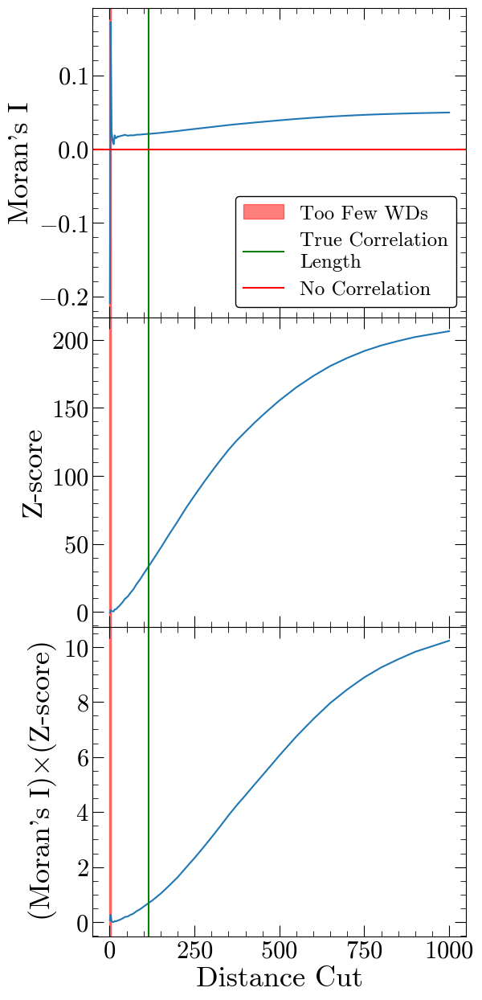

7.69 7e-08


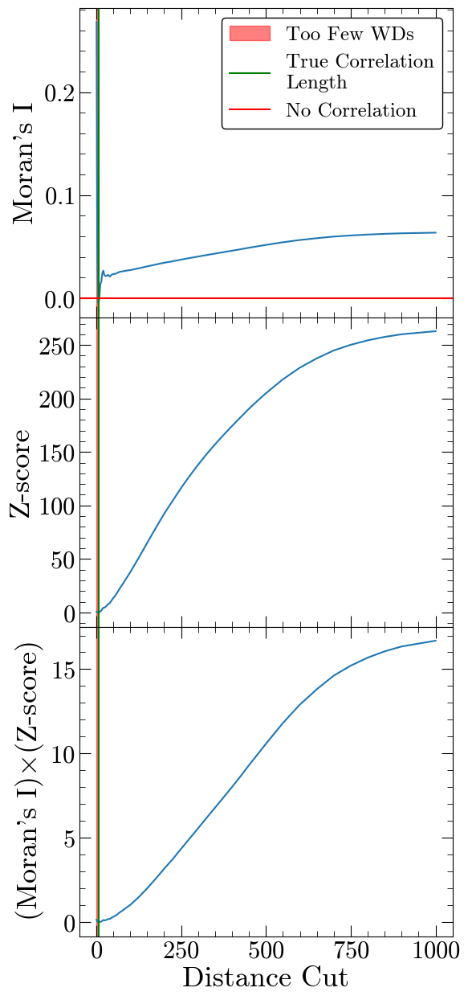

432.88 8.9e-10


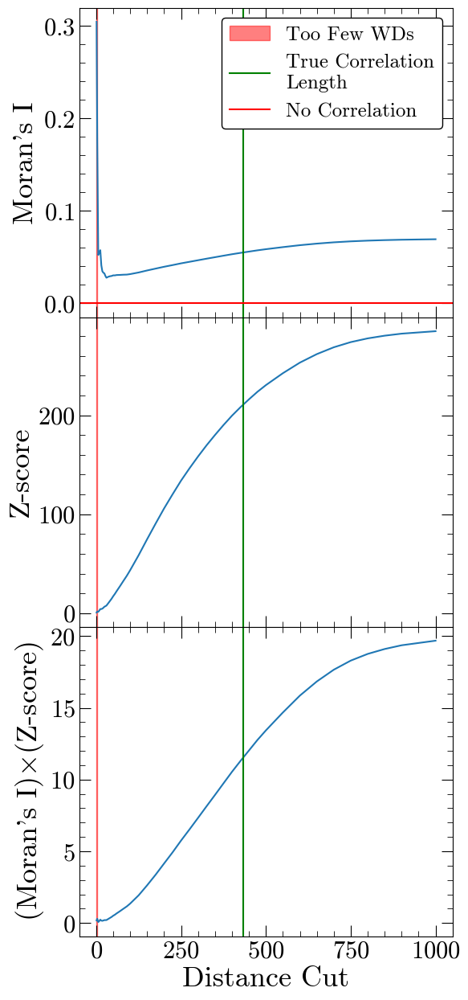

977.01 7e-08


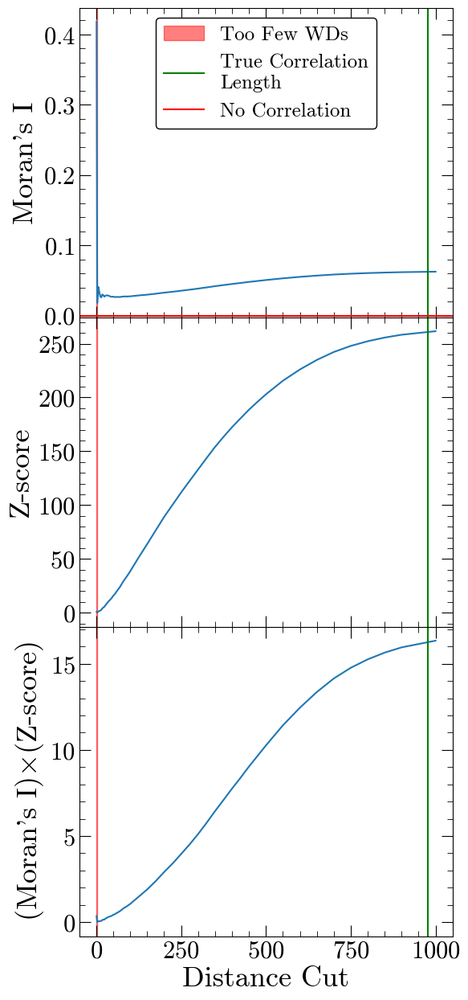

64.55 2.1e-07


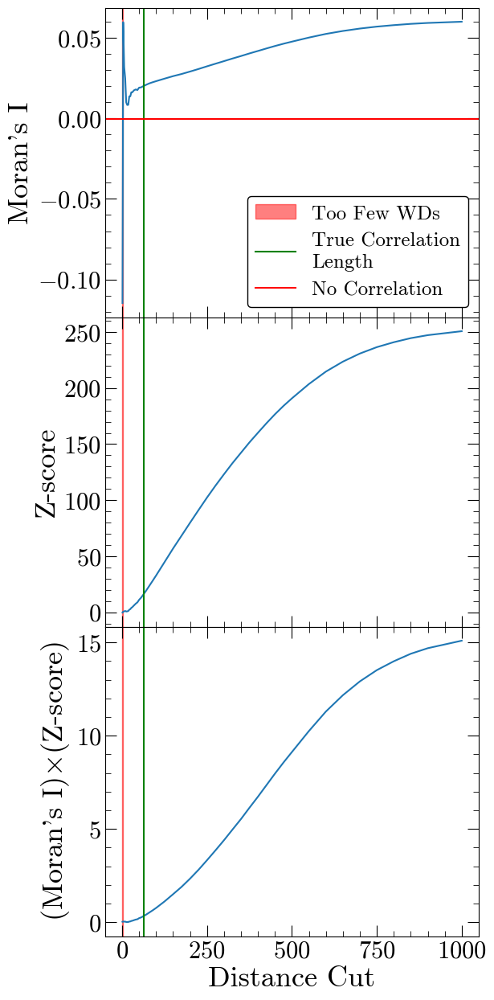

17.72 0.011


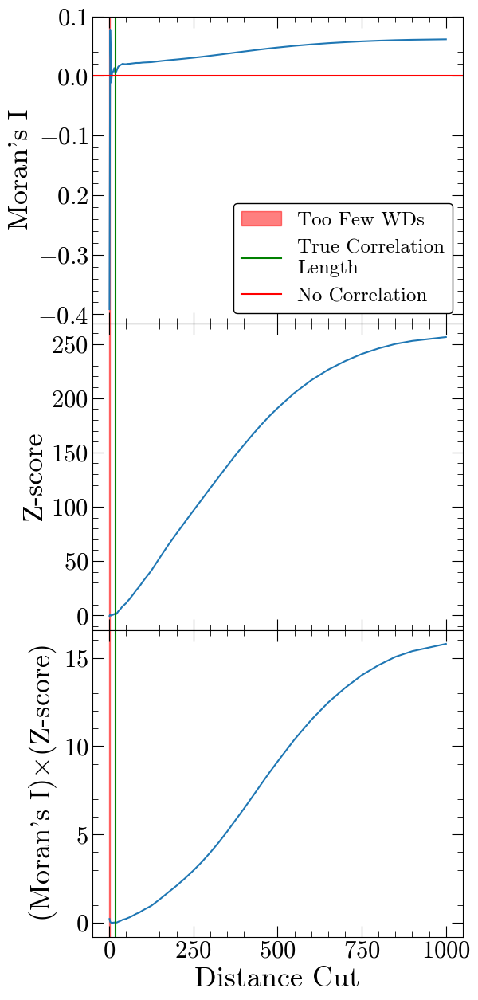

104.76 1.8e-06


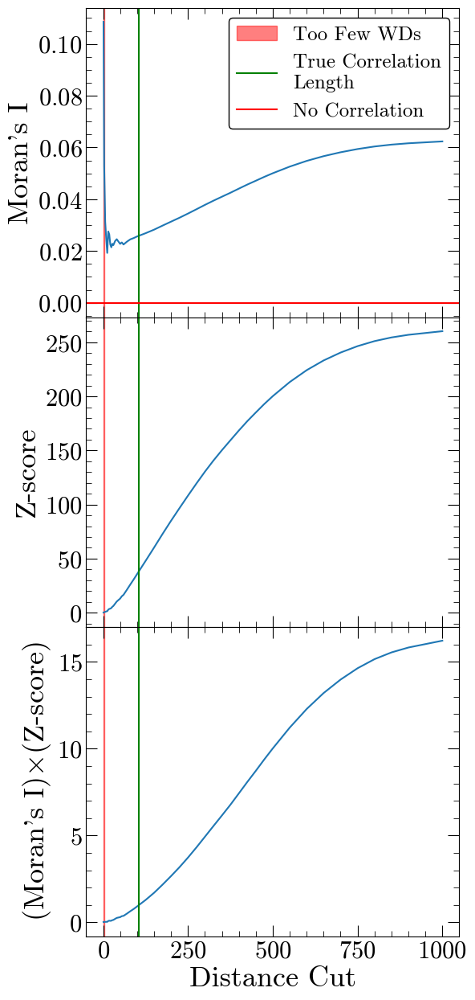

81.28 0.00014


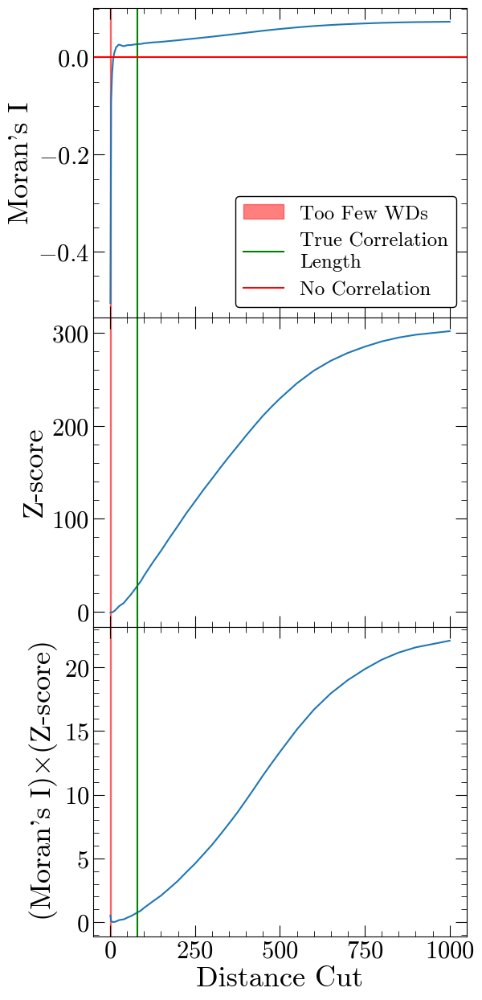

628.03 0.00043


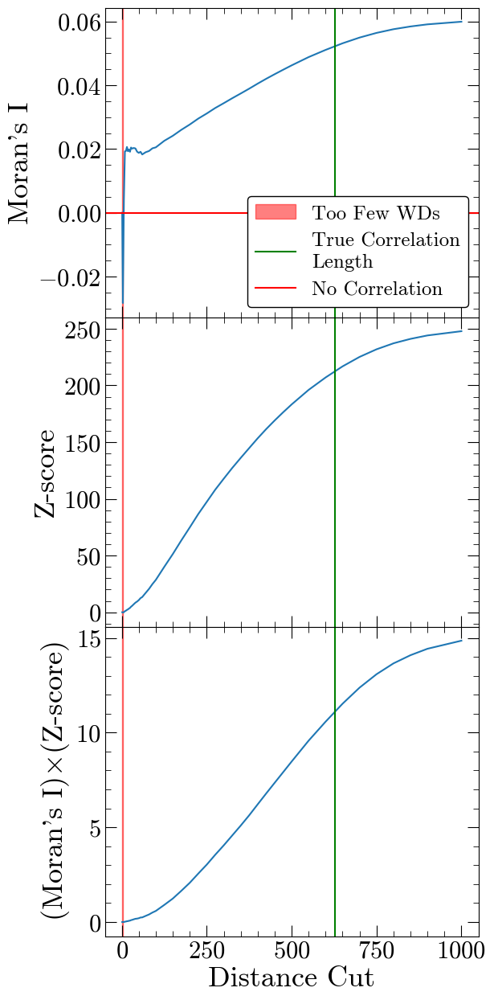

327.45 2.6e-09


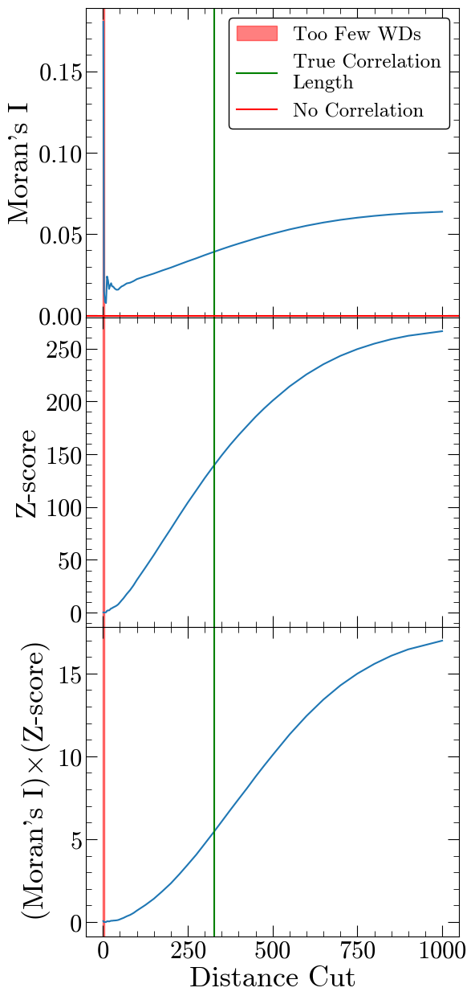

In [6]:
#display a few curves from the training data set
indices=np.random.randint(len(simulation_params_run), size=10)
for index in indices:
    corr_length=simulation_params_run[index][0]
    epsilon=simulation_params_run[index][1]
    print(corr_length,epsilon)
    sample_size=10207
    output=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

# Make a representative plot of various epsilons and correlation lengths

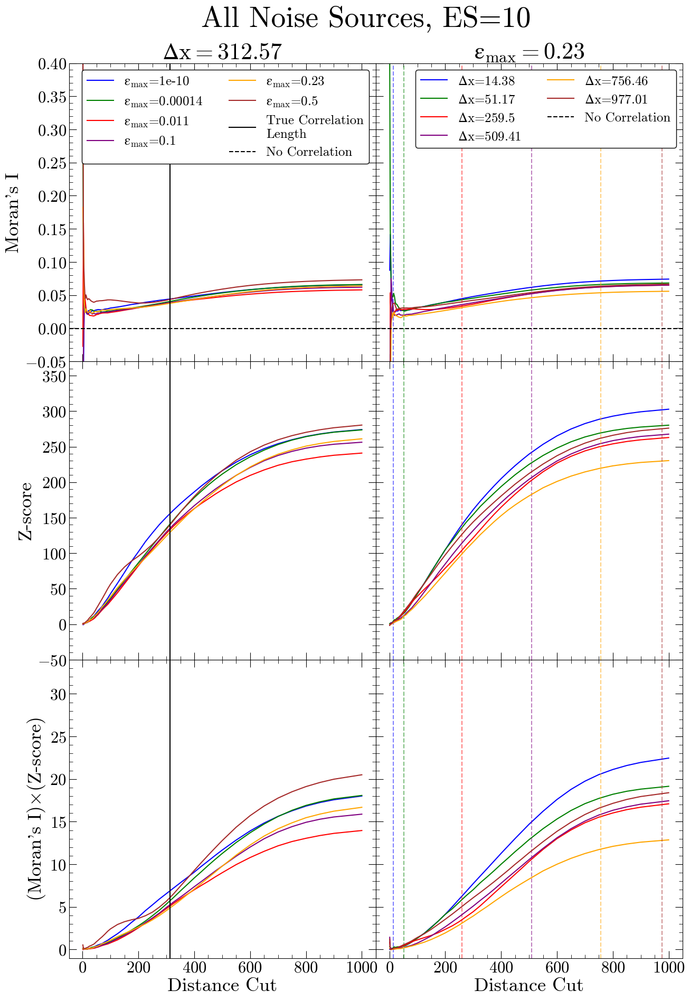

In [7]:
fig, ((ax1,ax4),(ax2,ax5),(ax3,ax6)) = plt.subplots(3,2,figsize=(15,22),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[1e-10,0.00014,0.011,0.1,0.23,0.5]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon_{max}$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='upper right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
    
#One epsilon length, various correlation lengths
epsilon=0.23
corr_lengths_subset=[14.38, 51.17, 259.5, 509.41, 756.46, 977.01]
for i in range(len(corr_lengths_subset)):
    corr_length=corr_lengths_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax4.plot(final_distances,moransIs,color=color,label='$\Delta x$='+str(corr_length))
    ax4.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax5.plot(final_distances,zscores,color=color)
    ax5.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax6.plot(final_distances,mult,color=color)  
    ax6.axvline(corr_length,color=color,linestyle='--',alpha=0.5)

ax4.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax4.legend(ncol=2,loc='upper right')

ax6.set_xlabel('Distance Cut')

ax4.set_title('$\epsilon_{max}=$'+str(epsilon))

#clean up the plot
ax1.set_ylim(-0.05,0.4)
ax4.set_ylim(-0.05,0.4)

ax2.set_ylim(-50,370)
ax5.set_ylim(-50,370)

ax3.set_ylim(-1,34)
ax6.set_ylim(-1,34)

ax4.set_yticklabels([]) 
ax5.set_yticklabels([]) 
ax6.set_yticklabels([]) 

fig.suptitle('All Noise Sources, ES=10', fontsize=40, x=0.5, y=0.93)
plt.subplots_adjust(wspace = 0,hspace=0)

plt.savefig('curves_all_noise_ES10.pdf', dpi=300)#, pad_inches=0.3)

(-0.02, 10.0)

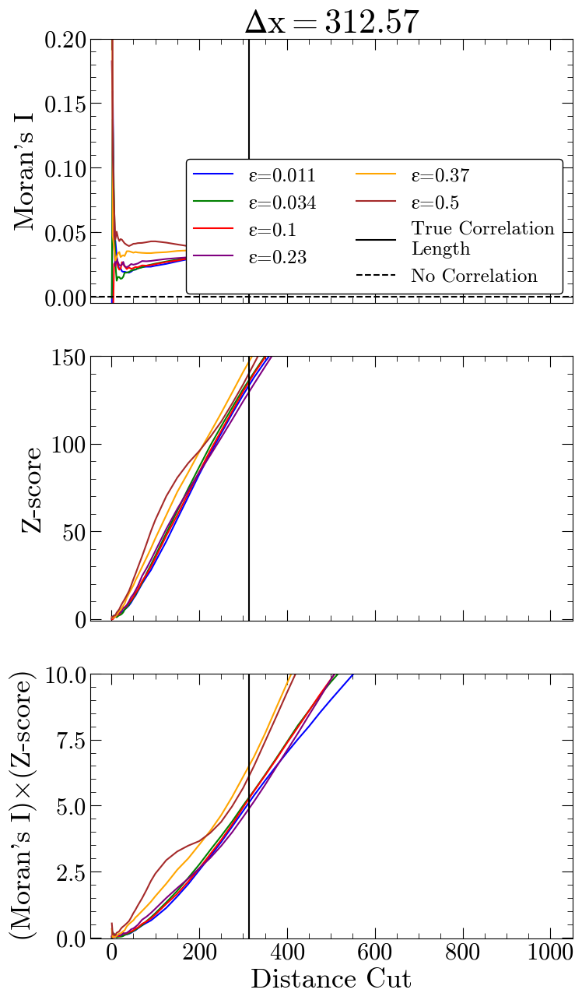

In [10]:
#find minimum visible epsilon

#min=0.5
fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(8,15),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[0.011,0.034,0.1,0.23,0.37,0.5]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='lower right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
 
#clean up the plot
ax1.set_ylim(-0.005,0.2)

ax2.set_ylim(-1,150)

ax3.set_ylim(-.02,10)

# Set up the training and testing data for the CNN

In [16]:
sample_size=10207

x_train=[]
y_train=[]
ep_train=[]
for simulation in simulation_params_run:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_train.append(normalized)
    #save correlation length as true label
    y_train.append(corr_length)
    #also save epsilon
    ep_train.append(epsilon)
    
x_train=np.array(x_train)
y_train=np.array(y_train)
ep_train=np.array(ep_train)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_train=np.nan_to_num(x_train)

#check for NaNs and Infs
print(np.isnan(x_train).any())
print(np.isinf(x_train).any())

training_data=pd.DataFrame()
training_data['y_true']=y_train
training_data['epsilon']=ep_train

training_data.head()

False
False


,y_true,epsilon
0,4.34,1.000000e-10
1,4.34,3.000000e-10
2,4.34,8.900000e-10
3,4.34,2.600000e-09
4,4.34,7.800000e-09


In [17]:
x_test=[]
y_test=[]
ep_test=[]
for simulation in simulation_params_run_testing:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'testing',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_test.append(normalized)
    #save correlation length as true label
    y_test.append(corr_length)
    #also save epsilon
    ep_test.append(epsilon)
    
x_test=np.array(x_test)
y_test=np.array(y_test)
ep_test=np.array(ep_test)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_test=np.nan_to_num(x_test)

#check for NaNs and Infs
print(np.isnan(x_test).any())
print(np.isinf(x_test).any())

testing_data=pd.DataFrame()
testing_data['y_true']=y_test
testing_data['epsilon']=ep_test

testing_data.head()

False
False


,y_true,epsilon
0,10,1.000000e-10
1,10,1.000000e-07
2,10,1.000000e-04
3,10,1.000000e-03
4,10,5.000000e-03


### Train and Test different CNN configurations

In [18]:
def comparison_stats(data,verbose,success_fit=False,success_fit_threshold=0.1):
    if success_fit:
        init_len=len(data)
        data['abs_frac_err']=np.abs((data['y_true']-data['y_pred'])/data['y_true'])
        data=data.query('abs_frac_err<@success_fit_threshold')
        num_success=len(data)
        #reset the indices
        indices=np.arange(0,len(data))
        data.set_index(indices,inplace=True)
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=num_success/init_len
    else:
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=None
    
    error=y_true-y_pred
    frac_err=error/y_true
    
    #calculate the rmse
    rmse = 0
    for i in range(len(y_true)):
        rmse += (error[i])**2
    rmse = np.sqrt(rmse / len(y_true))
    
    #calculate the median absolute error between the datasets
    mae=np.median(np.abs(error))

    #calculate the bias between the datasets
    bias=np.median(error)
    
    #calculate the median absolute fractional error
    med_frac=np.median(np.abs(frac_err))
    
    if verbose:
        if success_fit:
            print(r'Frac Success Fit: {:2.3f} '.format(frac_success))
        print(r'RMSE: {:2.3f} '.format(rmse)+'pc')
        print(r'MAE: {:2.3f} '.format(mae)+'pc')
        print(r'BIAS: {:2.3f} '.format(bias)+'pc')
        print(r'MED FRAC ERR: {:2.3f} '.format(med_frac))
        
    return(rmse,mae,bias,med_frac,error,frac_err,frac_success)

In [19]:
def comparison_plots(training_data,testing_data,success_fit_threshold=0.1,statx=10,staty=700,statdy=50,lim='default', siegel=True,verbose=True):
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    if verbose:
        print('Training Stats')
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,verbose)
    if verbose:
        print('')
        print('Training Stats, Successful Fits')
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,verbose,True,success_fit_threshold)
    if verbose:
        print('')
        print('Testing Stats')
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,verbose)
    if verbose:
        print('')
        print('Testing Stats, Successful Fits')
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,verbose,True,success_fit_threshold)
    
    stats_df=pd.DataFrame()
    stats_df['mae_training']=[mae_training]
    stats_df['frac_success_training']=[frac_success_training]
    stats_df['mae_testing']=[mae_testing]
    stats_df['frac_success_testing']=[frac_success_testing]
    
    #plot the agreement with stats
    fig, (ax1,ax2) =plt.subplots(1,2,figsize=(16,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
        
    ax2.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax2.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax2.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax2.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax2.legend()
    if lim!='default':
        ax2.set_xlim((lim[0],lim[1]))
        ax2.set_ylim((lim[0],lim[1]))
    ax2.set_yscale('log')
    ax2.set_xscale('log')
    plt.show()
    
    #plot the agreement with trendlines
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    #add a linear trendlines
    if siegel==True:
        coef = stats.siegelslopes(y_pred_testing, y_true_testing)
        poly1d_fn = np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    else:
        coef= np.polyfit(y_true_testing,y_pred_testing,1)
        poly1d_fn= np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    plt.show()

    # plot the fractional error between the datasets
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.legend()
    plt.show()
    
    # plot the fractional error between the datasets
    # again but zoomed in
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.set_ylim((-1,1))
    ax1.legend()
    plt.show()
    
    return(stats_df)
    

In [20]:
#define a function to create the heatmap
def heatmap(data, row_labels, col_labels, ax=None):
    if not ax:
        ax = plt.gca()
        
    # Define color map with custom gradients
    cmap = plt.cm.viridis  # Default, replace with any colormap of your choice
    # Define boundaries for the color ranges
    boundaries = [0, 2, 4, 6, 8, 10, 1000]
    # Define colors corresponding to each range (make sure this matches the number of ranges)
    colors_for_ranges = [
    '#228B22',  # Forest Green
    '#32CD32',  # Lime Green
    '#FFD700',  # Gold (Yellow)
    '#FFA500',  # Orange
    '#FF4500',  # Orange Red
    '#DC143C',  # Crimson
    'black']
    # Create a ListedColormap and BoundaryNorm
    cmap = pltcolors.ListedColormap(colors_for_ranges)
    norm = pltcolors.BoundaryNorm(boundaries, cmap.N)
    
    # Plot the heatmap
    im = ax.imshow(data, cmap=cmap, norm=norm)
    
    #label rows/columns
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_xticklabels(col_labels)#, fontsize=10)
    ax.set_yticks(np.arange(data.shape[0]))
    ax.set_yticklabels(row_labels)
    
    #draw grid lines
    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="k", linestyle='-', linewidth=0.5,alpha=0.3)
    ax.tick_params(which="minor", bottom=False, left=False,top=False, right=False)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    return im

def heatmap_testing_data(testing_data,figtitle=None,savefig=False,figname=None):
    data=[]
    failed_fit_region_count=0
    for corr_len in corr_lengths_testing:
        tmp=[]
        for epsilon in epsilons_testing:
            val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
            tmp.append(val)
            if val>10:
                failed_fit_region_count+=1
        data.append(tmp)
    data=np.array(data)
    
    fig,ax0=plt.subplots(1, 1, figsize=(10, 10))
    ylabels=[str(i) for i in corr_lengths_testing]
    xlabels=[str(i) for i in epsilons_testing]
    hm=heatmap(data, ylabels, xlabels, ax=ax0)
    ax0.set_xlabel('$\epsilon$')
    ax0.set_ylabel('$\Delta x_{true}$')
    
    ax0.set_title(figtitle)
    
    #plot colorbar
    cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])
    fig.colorbar(hm, cbar_ax)
    cbar_ax.set_ylabel("Absolute Percent Error")#,fontsize=16)
    
    if savefig:
        plt.savefig(figname+'.pdf', dpi=300)
        
    plt.show()
    print('Number of squares with abs percent err>10%, ', failed_fit_region_count)
    
    return(failed_fit_region_count)

In [34]:
def test_model(model,stats=True,plot=True):
    sample_size=10207
    
    # use the model to predict the training data
    y_pred_train = model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the testing data
    y_pred_test = model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold=0.1)
    
    if plot:
        #some runs return NaNs, show those fits
        nan_corr_lengths=testing_data[testing_data['y_pred'].isna()]
        print('')
        print('Showing the '+str(len(nan_corr_lengths))+' curves that returned NaNs')
        display(nan_corr_lengths)
        for i in range(len(nan_corr_lengths)):
            corr_length=nan_corr_lengths['y_true'].to_list()[i]
            epsilon=nan_corr_lengths['epsilon'].to_list()[i]
            output=get_output(corr_length,epsilon,sample_size,'testing',plot=True)

        #show comparison stats and plots
        stats_df=comparison_plots(training_data,testing_data)
        
        #show testing data absolute percent error heatmap
        failed_fit_region_count=heatmap_testing_data(testing_data) 
    else:
        stats_df=None
        nan_corr_lengths='Not saved!'
        failed_fit_region_count=0
        for corr_len in corr_lengths_testing:
            for epsilon in epsilons_testing:
                val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
                if val>10:
                    failed_fit_region_count+=1
    
    if stats:
        return(stats_df)
    else:
        return(failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths)

# Pick models and tune the model hyperparameters

1. **Number of Filters in Convolutional Layers**
   The number of filters (also known as the number of output channels) determines the depth of the feature maps after each convolutional layer.
   **What to try:**
   - You can experiment with **increasing** the number of filters in each layer.
   - Alternatively, **decrease** the number of filters to make the model simpler and see if performance improves.
   
   Keep in mind that increasing the number of filters typically increases the model’s capacity, which can improve performance on more complex tasks but may also lead to overfitting if not properly regularized.

2. **Kernel Size**
   The kernel size defines the window of the convolution. 
   **What to try:**
   - **Larger kernel sizes** (e.g., 5 or 7) might capture broader patterns, which can be useful if the input data has long-range dependencies.
   - **Smaller kernel sizes** (e.g., 1 or 2) might be beneficial if you want to capture very fine-grained features.

3. **Number of Layers**
   The depth of the network can have a significant impact on its performance.
   **What to try:**
   - Adding more **convolutional layers** (e.g., 4 or 5 layers instead of 3) could help the model learn more complex patterns.
   - Alternatively, you can **reduce the number of layers** and see if performance improves, especially if overfitting is a concern.

4. **Pooling Layers**
   Pooling layers help reduce spatial dimensions and retain important features. You're using `MaxPooling1D(2)` after each convolution layer, which is a good starting point.
   **What to try:**
   - **Change the pooling size** (e.g., use `MaxPooling1D(3)` or `MaxPooling1D(4)`).
   - Experiment with different **types of pooling** (e.g., **AveragePooling1D**) to see if it affects performance.

5. **Dense Layer Units**
   In your current model, the final dense layer has 128 units with ReLU activation. The number of units in this layer controls the representational capacity of the fully connected portion of the network.
   **What to try:**
   - You can experiment with **increasing** or **decreasing** the number of units (e.g., try 64 or 256 units).
   - You can also **add another dense layer** between the existing dense layer and the output to increase the model's capacity.

6. **Optimizer and Learning Rate**
   You're using the **Adam optimizer** with its default settings, which is a good default choice for most tasks. However, adjusting the learning rate can have a significant impact on performance.
   **What to try:**
   - **Adjust the learning rate** (e.g., `learning_rate=0.001`, `learning_rate=0.0005`, `learning_rate=0.0001`).
   - You could also experiment with **different optimizers** (e.g., **SGD**, **RMSprop**) to see if they improve convergence speed or final accuracy.

7. **Batch Size**
   The batch size you’re currently using is 32, which is a standard choice.
   **What to try:**
   - Experiment with **larger batch sizes** (e.g., 64 or 128) to speed up training, or **smaller batch sizes** (e.g., 16 or 8) if you believe that could help the model generalize better.
   - Smaller batch sizes can help avoid local minima, while larger batch sizes usually converge faster.

8. **Regularization (Dropout or L2 Regularization)**
   You’re not using any regularization at the moment, which may cause overfitting, especially with a deep model.
   **What to try:**
   - **Dropout**: Add `Dropout` layers after the convolutional or dense layers to help prevent overfitting. Try dropout rates between 0.2 and 0.5.
   - **L2 Regularization**: Add L2 regularization to your layers, which helps penalize large weights and reduces overfitting. Example: `kernel_regularizer=l2(0.01)`.

9. **Activation Function**
   You're using ReLU as the activation function for all layers, which is quite common.
   **What to try:**
   - Experiment with different **activation functions** for the hidden layers, such as **LeakyReLU**, **ELU**, or **SELU**.
   - For the output layer, if you're predicting a continuous variable (since you're using `mse` loss), you may want to use a **linear activation** (which is the default for `Dense(1)`).


Epoch 1/100
92/92 [==============================] - 0s 2ms/step - loss: 119527.5234
Epoch 2/100
92/92 [==============================] - 0s 3ms/step - loss: 68073.4453
Epoch 3/100
92/92 [==============================] - 0s 3ms/step - loss: 67691.9766
Epoch 4/100
92/92 [==============================] - 0s 3ms/step - loss: 67920.4844
Epoch 5/100
92/92 [==============================] - 0s 3ms/step - loss: 67782.9297
Epoch 6/100
92/92 [==============================] - 0s 3ms/step - loss: 67750.8750
Epoch 7/100
92/92 [==============================] - 0s 3ms/step - loss: 67921.0859
Epoch 8/100
92/92 [==============================] - 0s 3ms/step - loss: 68046.0781
Epoch 9/100
92/92 [==============================] - 0s 3ms/step - loss: 67801.2500
Epoch 10/100
92/92 [==============================] - 0s 3ms/step - loss: 67878.1172
Epoch 11/100
92/92 [==============================] - 0s 3ms/step - loss: 67709.1484
Epoch 12/100
92/92 [==============================] - 0s 3ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 256.647 pc
MAE: 193.523 pc
BIAS: -69.706 pc
MED FRAC ERR: 0.610 

Training Stats, Successful Fits
Frac Success Fit: 0.074 
RMSE: 18.137 pc
MAE: 14.946 pc
BIAS: 0.851 pc
MED FRAC ERR: 0.051 

Testing Stats
RMSE: 321.408 pc
MAE: 236.845 pc
BIAS: -10.388 pc
MED FRAC ERR: 0.607 

Testing Stats, Successful Fits
Frac Success Fit: 0.090 
RMSE: 15.128 pc
MAE: 11.594 pc
BIAS: -10.037 pc
MED FRAC ERR: 0.048 


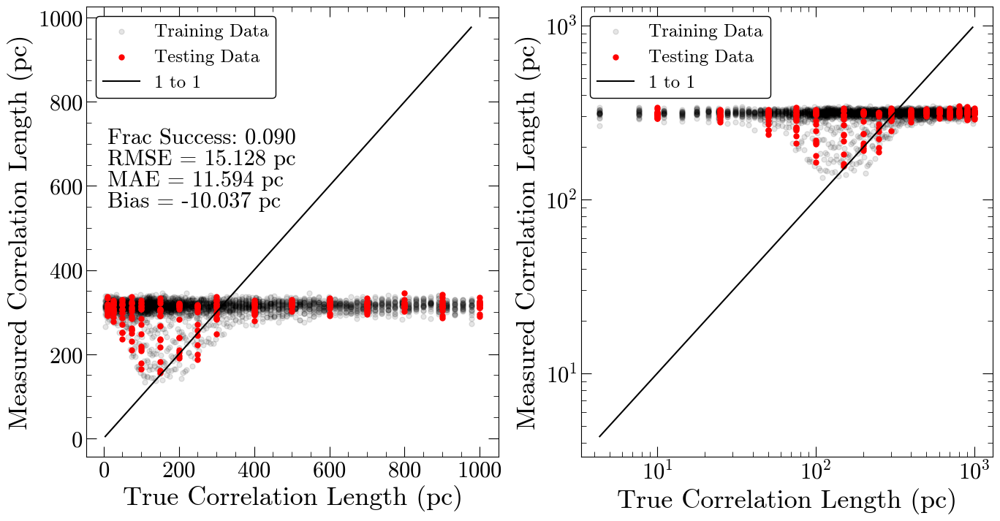

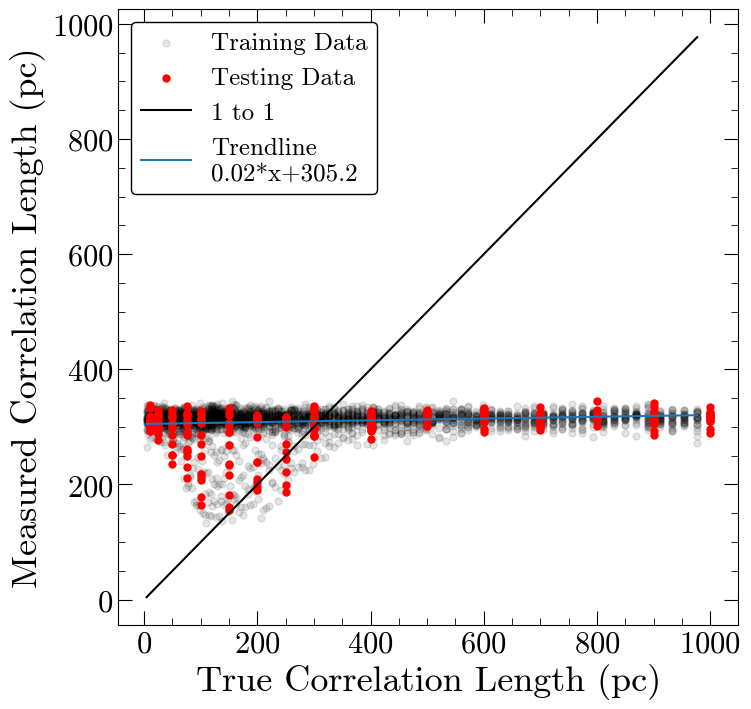

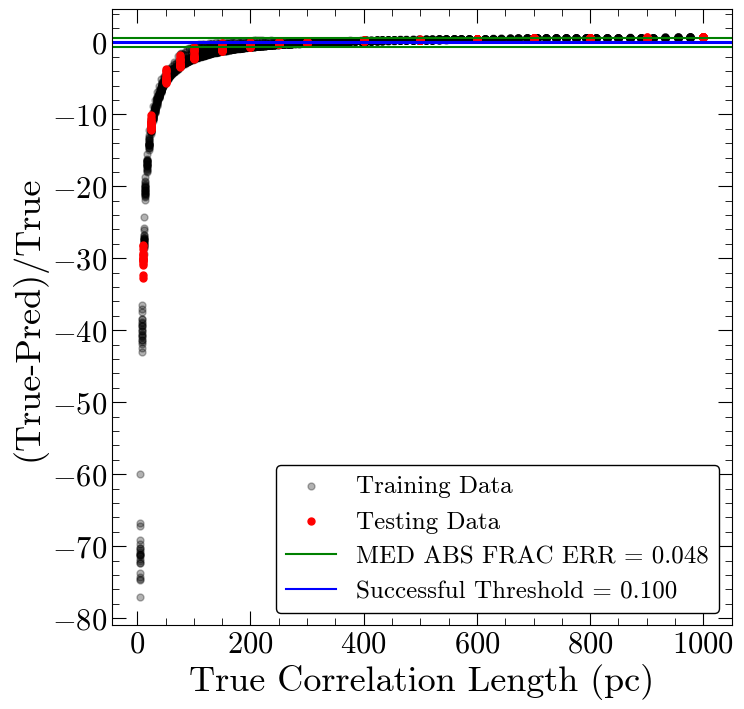

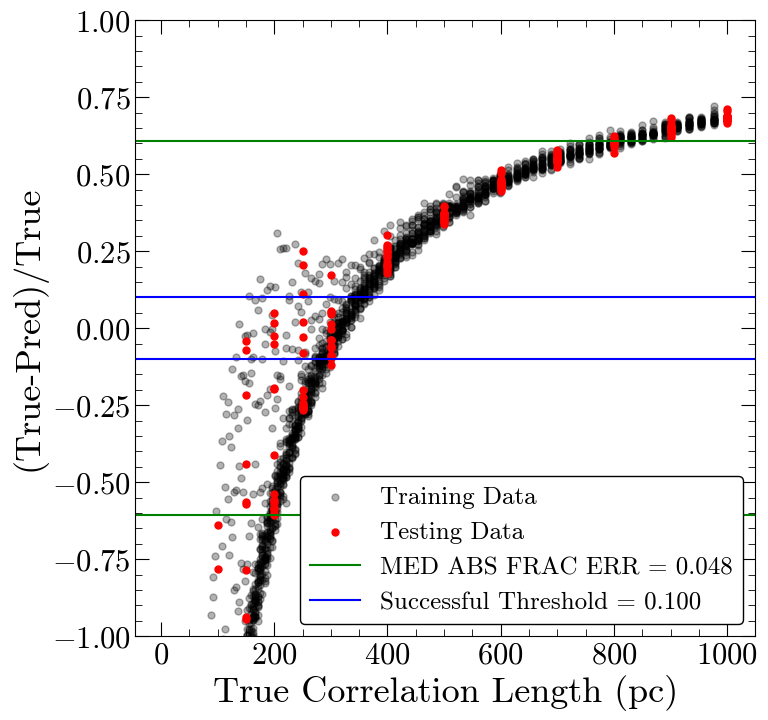

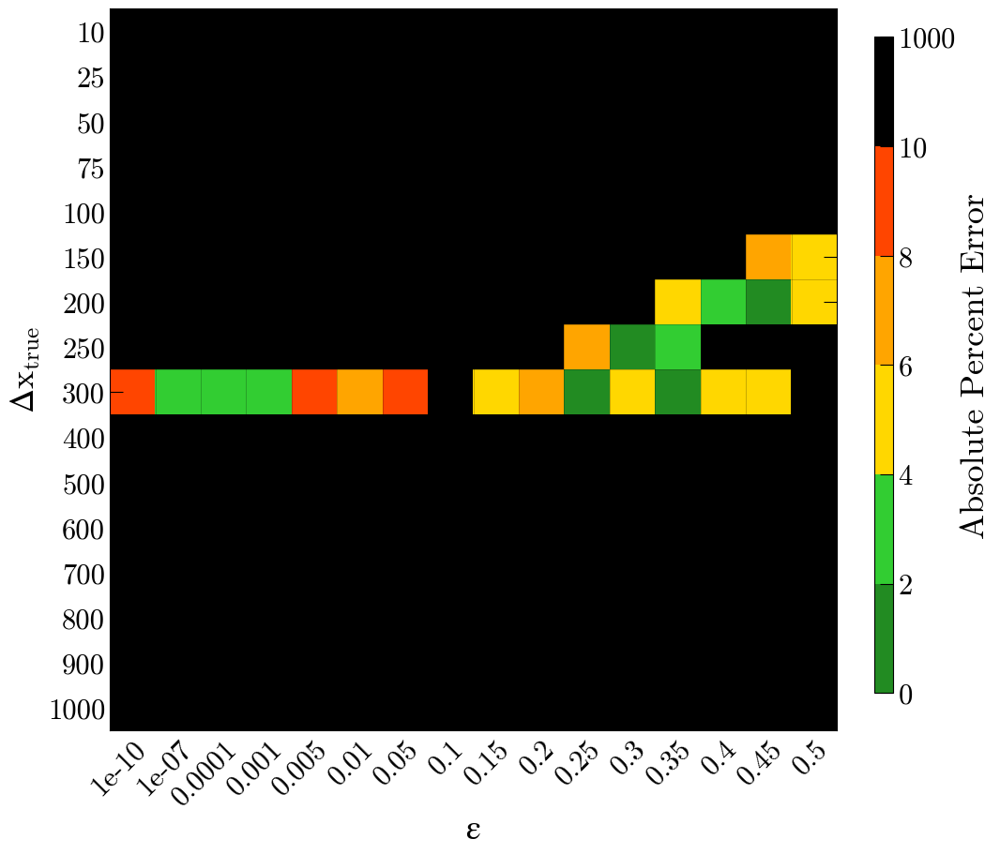

Number of squares with abs percent err>10%,  233


In [22]:
#simple model
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats for all models to compare and find best model
all_model_stats=output

Epoch 1/200
92/92 [==============================] - 0s 3ms/step - loss: 134495.5469
Epoch 2/200
92/92 [==============================] - 0s 4ms/step - loss: 68098.1797
Epoch 3/200
92/92 [==============================] - 0s 3ms/step - loss: 67729.0156
Epoch 4/200
92/92 [==============================] - 0s 3ms/step - loss: 67682.0391
Epoch 5/200
92/92 [==============================] - 0s 4ms/step - loss: 68278.8984
Epoch 6/200
92/92 [==============================] - 0s 3ms/step - loss: 67760.4922
Epoch 7/200
92/92 [==============================] - 0s 3ms/step - loss: 67584.0156
Epoch 8/200
92/92 [==============================] - 0s 3ms/step - loss: 67824.6875
Epoch 9/200
92/92 [==============================] - 0s 3ms/step - loss: 67651.9297
Epoch 10/200
92/92 [==============================] - 0s 3ms/step - loss: 67649.2031
Epoch 11/200
92/92 [==============================] - 0s 3ms/step - loss: 67609.9453
Epoch 12/200
92/92 [==============================] - 0s 3ms/step - loss:

92/92 [==============================] - 0s 2ms/step - loss: 66006.1094
Epoch 193/200
92/92 [==============================] - 0s 2ms/step - loss: 65974.6797
Epoch 194/200
92/92 [==============================] - 0s 2ms/step - loss: 65701.0469
Epoch 195/200
92/92 [==============================] - 0s 2ms/step - loss: 65799.6719
Epoch 196/200
92/92 [==============================] - 0s 3ms/step - loss: 65754.9688
Epoch 197/200
92/92 [==============================] - 0s 2ms/step - loss: 66062.9531
Epoch 198/200
92/92 [==============================] - 0s 2ms/step - loss: 65774.8203
Epoch 199/200
92/92 [==============================] - 0s 2ms/step - loss: 65807.1406
Epoch 200/200
92/92 [==============================] - 0s 2ms/step - loss: 65757.6172

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 257.135 pc
MAE: 182.284 pc
BIAS: -48.852 pc
MED FRAC ERR: 0.606 

Training Stats, Successful Fits
Frac Success Fit: 0.074 
RMSE: 16.313 pc
MAE: 12.777 pc
BIAS: 1.872 pc
MED FRAC ERR: 0.046 

Testing Stats
RMSE: 324.840 pc
MAE: 218.975 pc
BIAS: 21.666 pc
MED FRAC ERR: 0.620 

Testing Stats, Successful Fits
Frac Success Fit: 0.066 
RMSE: 12.341 pc
MAE: 7.873 pc
BIAS: -1.178 pc
MED FRAC ERR: 0.030 


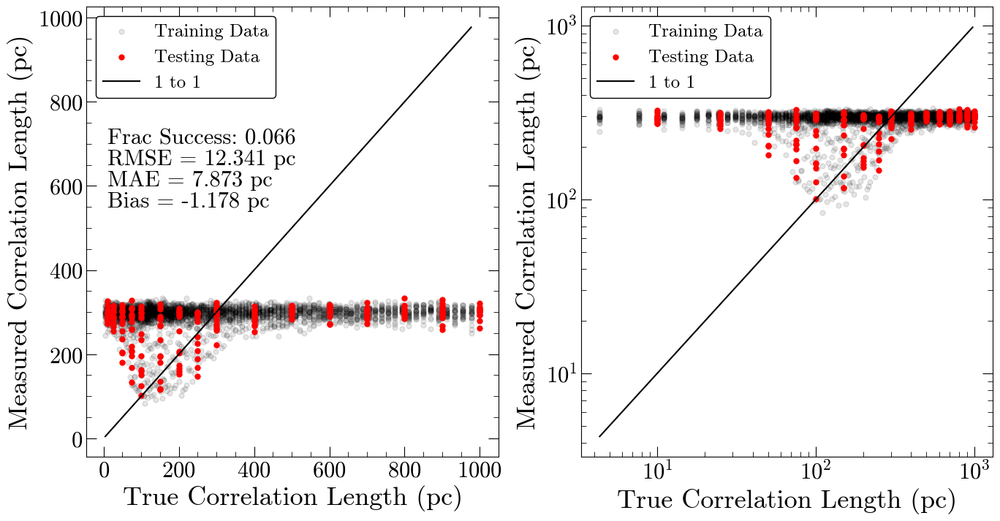

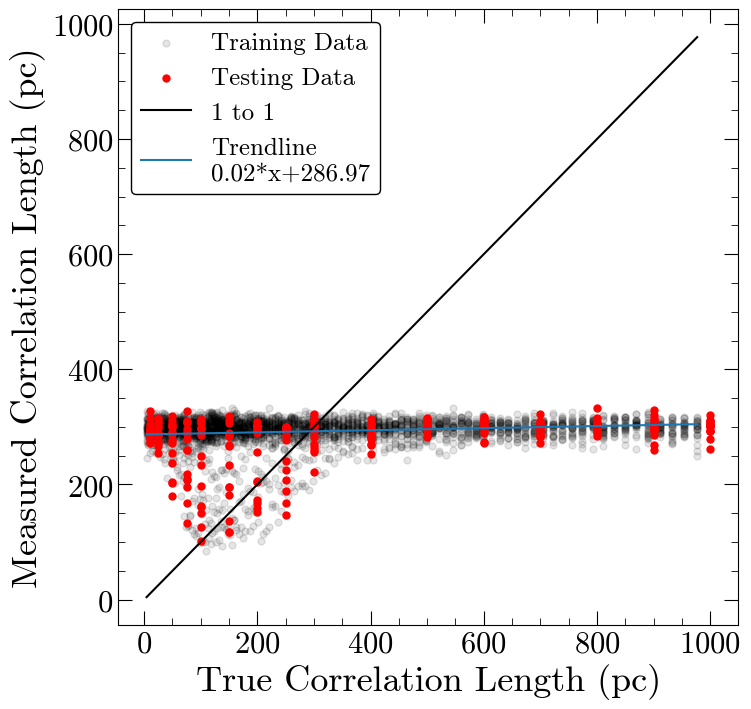

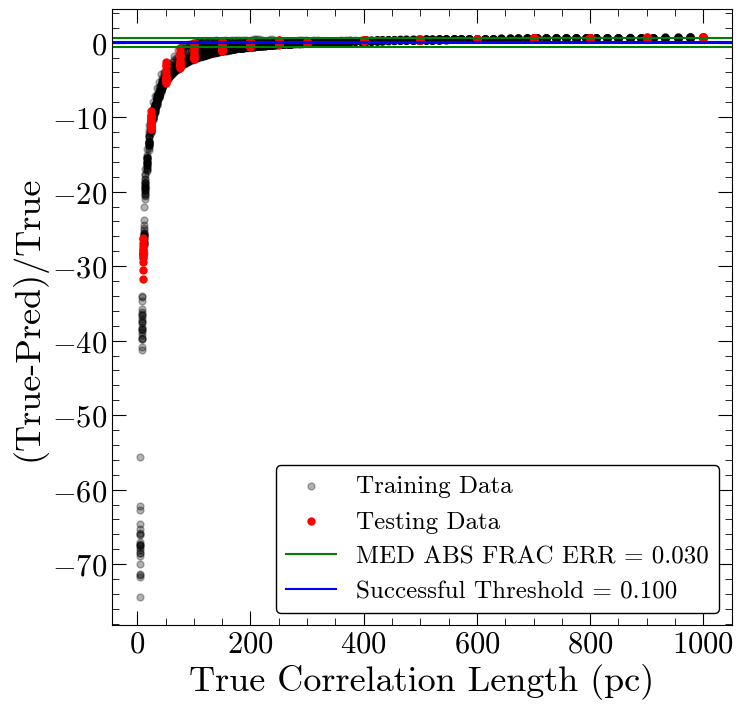

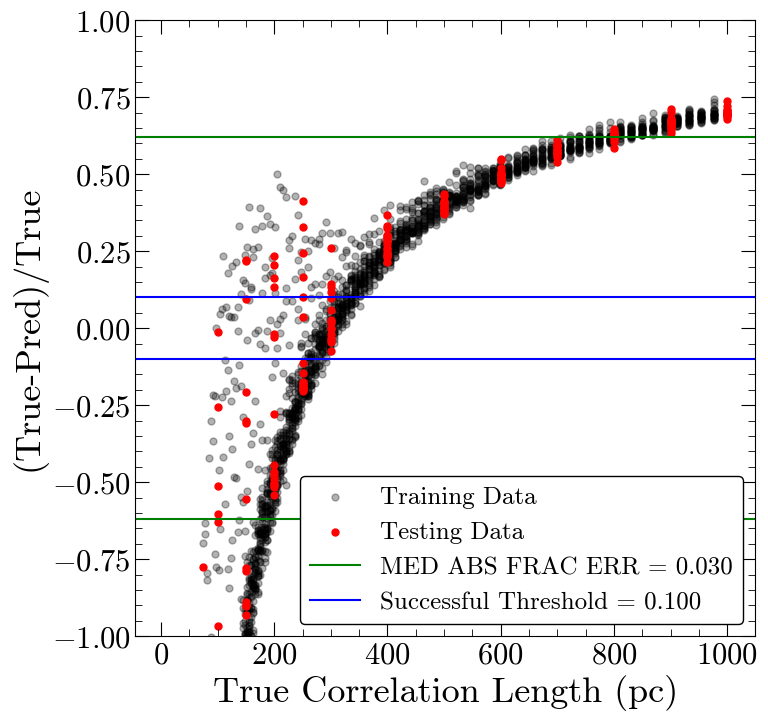

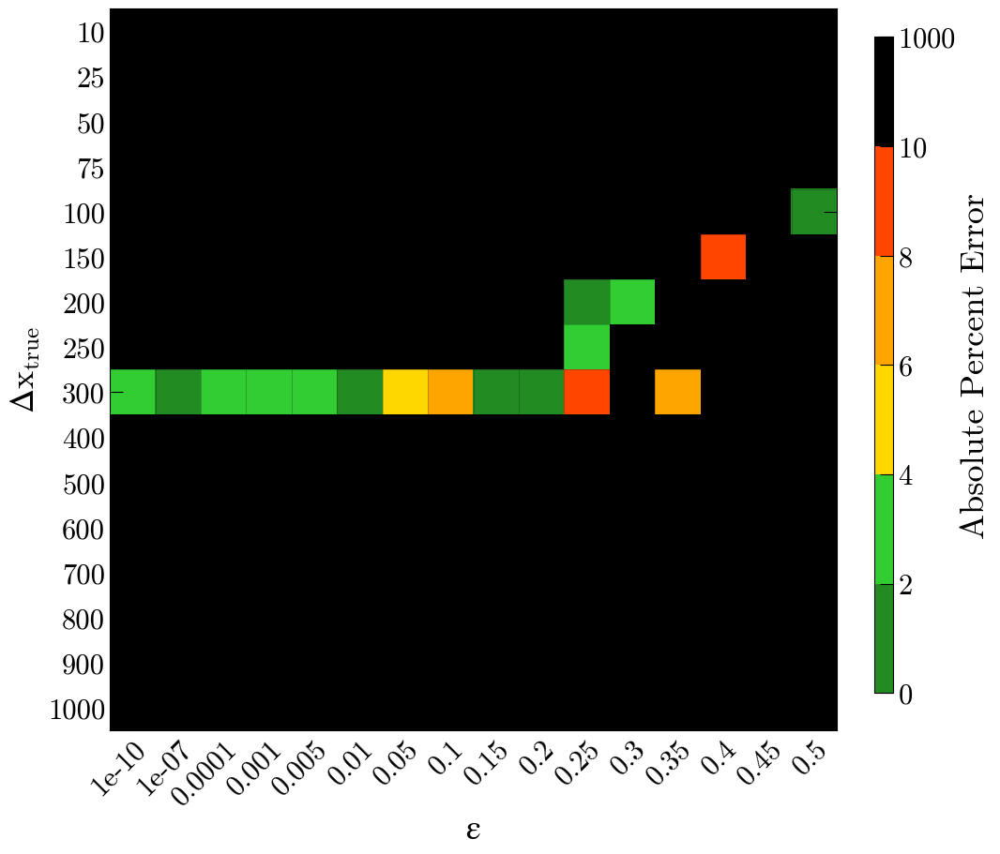

Number of squares with abs percent err>10%,  239


In [23]:
#simple model, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 0s 3ms/step - loss: 104736.7109
Epoch 2/100
92/92 [==============================] - 0s 4ms/step - loss: 67832.0391
Epoch 3/100
92/92 [==============================] - 0s 4ms/step - loss: 67868.7188
Epoch 4/100
92/92 [==============================] - 0s 4ms/step - loss: 67819.2656
Epoch 5/100
92/92 [==============================] - 0s 4ms/step - loss: 67616.8203
Epoch 6/100
92/92 [==============================] - 0s 4ms/step - loss: 67880.5859
Epoch 7/100
92/92 [==============================] - 0s 4ms/step - loss: 67937.7656
Epoch 8/100
92/92 [==============================] - 0s 4ms/step - loss: 68015.7812
Epoch 9/100
92/92 [==============================] - 0s 4ms/step - loss: 67787.5938
Epoch 10/100
92/92 [==============================] - 0s 4ms/step - loss: 68214.4453
Epoch 11/100
92/92 [==============================] - 0s 4ms/step - loss: 67802.1797
Epoch 12/100
92/92 [==============================] - 0s 4ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 257.395 pc
MAE: 179.177 pc
BIAS: -44.116 pc
MED FRAC ERR: 0.602 

Training Stats, Successful Fits
Frac Success Fit: 0.073 
RMSE: 16.025 pc
MAE: 12.315 pc
BIAS: 1.471 pc
MED FRAC ERR: 0.044 

Testing Stats
RMSE: 325.990 pc
MAE: 216.046 pc
BIAS: 23.502 pc
MED FRAC ERR: 0.622 

Testing Stats, Successful Fits
Frac Success Fit: 0.062 
RMSE: 11.350 pc
MAE: 7.605 pc
BIAS: 3.493 pc
MED FRAC ERR: 0.028 


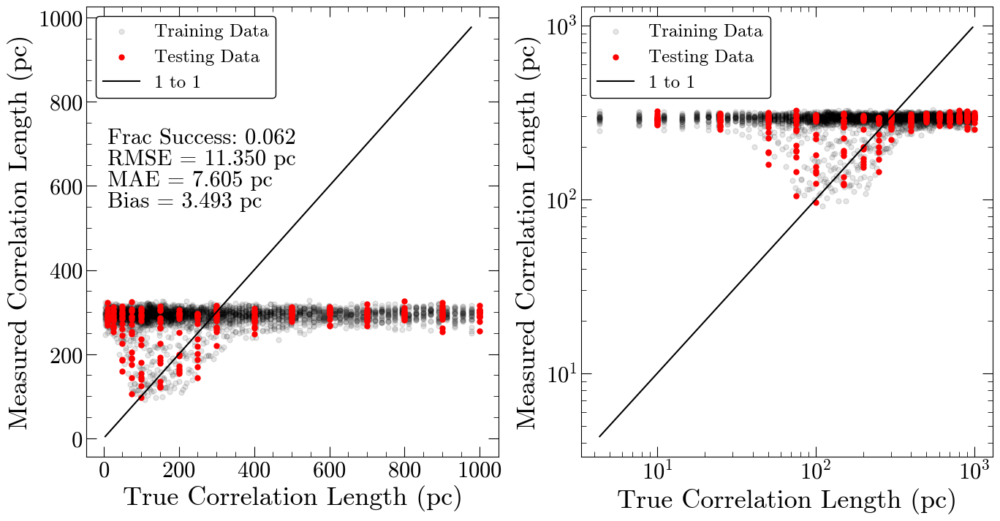

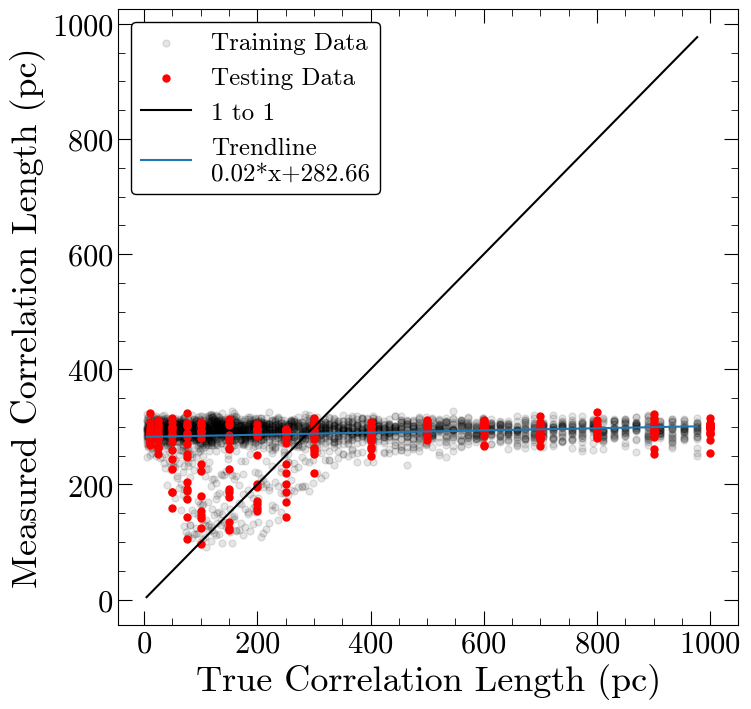

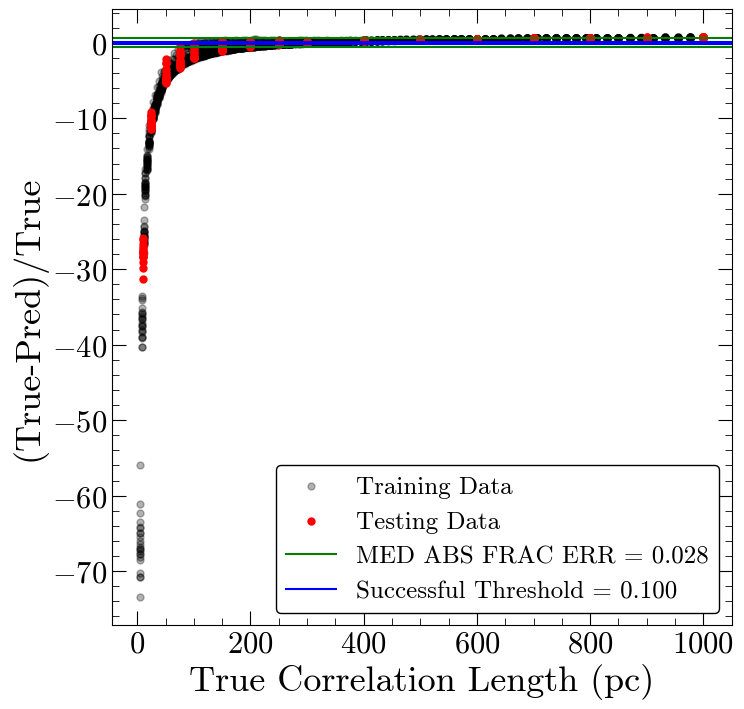

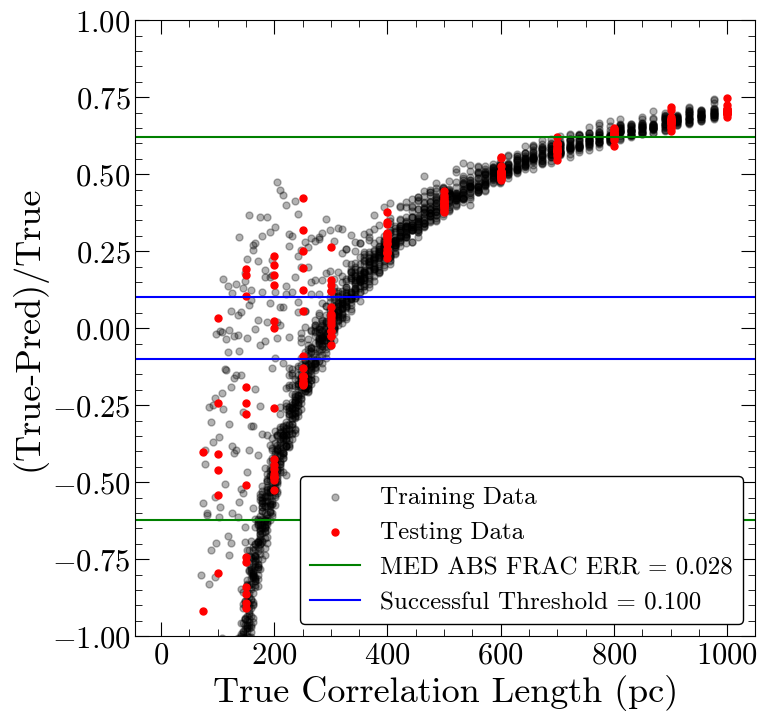

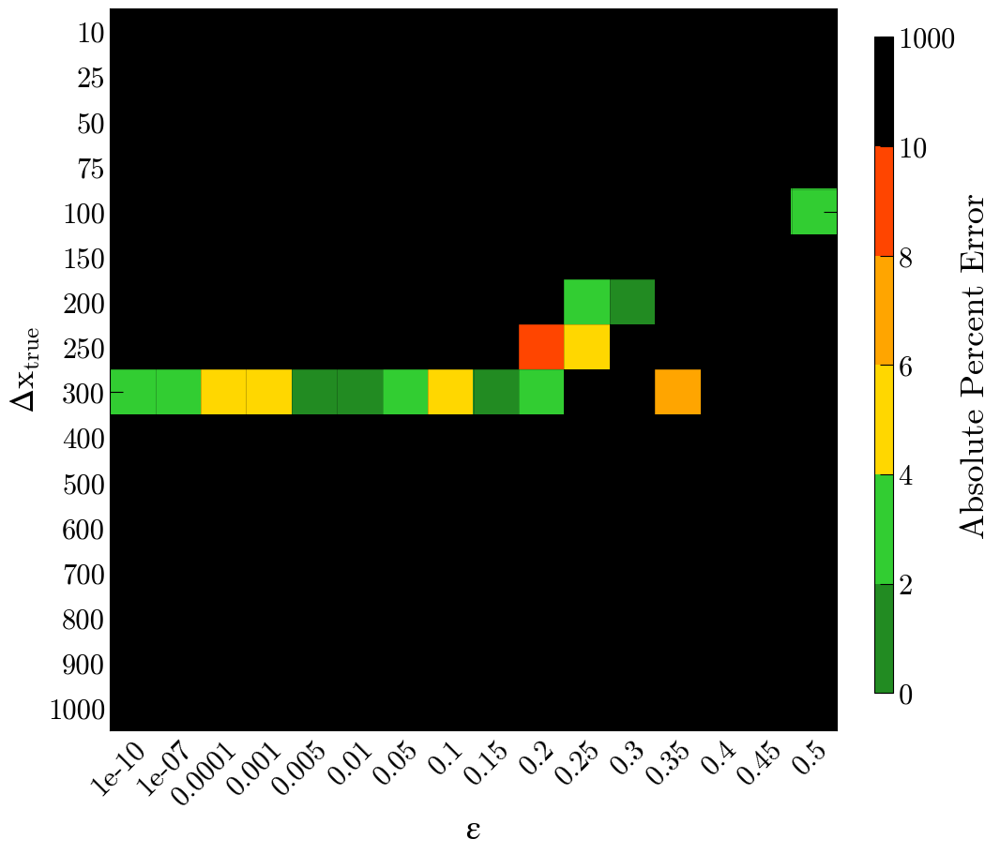

Number of squares with abs percent err>10%,  240


In [24]:
#model with more layers
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 0s 3ms/step - loss: 102402.9141
Epoch 2/200
92/92 [==============================] - 0s 5ms/step - loss: 68596.2109
Epoch 3/200
92/92 [==============================] - 0s 4ms/step - loss: 68049.7500
Epoch 4/200
92/92 [==============================] - 0s 4ms/step - loss: 68169.5859
Epoch 5/200
92/92 [==============================] - 0s 5ms/step - loss: 67963.8828
Epoch 6/200
92/92 [==============================] - 0s 5ms/step - loss: 68233.7031
Epoch 7/200
92/92 [==============================] - 0s 4ms/step - loss: 67811.9375
Epoch 8/200
92/92 [==============================] - 0s 4ms/step - loss: 68226.5469
Epoch 9/200
92/92 [==============================] - 0s 4ms/step - loss: 67680.0938
Epoch 10/200
92/92 [==============================] - 0s 4ms/step - loss: 67760.2031
Epoch 11/200
92/92 [==============================] - 0s 4ms/step - loss: 68012.1641
Epoch 12/200
92/92 [==============================] - 0s 4ms/step - loss:

92/92 [==============================] - 0s 3ms/step - loss: 65496.2539
Epoch 193/200
92/92 [==============================] - 0s 3ms/step - loss: 65310.6562
Epoch 194/200
92/92 [==============================] - 0s 3ms/step - loss: 65495.9961
Epoch 195/200
92/92 [==============================] - 0s 3ms/step - loss: 65393.8125
Epoch 196/200
92/92 [==============================] - 0s 3ms/step - loss: 65371.4531
Epoch 197/200
92/92 [==============================] - 0s 3ms/step - loss: 65119.4297
Epoch 198/200
92/92 [==============================] - 0s 3ms/step - loss: 65808.4141
Epoch 199/200
92/92 [==============================] - 0s 3ms/step - loss: 65733.8125
Epoch 200/200
92/92 [==============================] - 0s 3ms/step - loss: 65490.6172

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 255.212 pc
MAE: 190.303 pc
BIAS: -57.766 pc
MED FRAC ERR: 0.596 

Training Stats, Successful Fits
Frac Success Fit: 0.081 
RMSE: 17.497 pc
MAE: 14.211 pc
BIAS: 3.929 pc
MED FRAC ERR: 0.051 

Testing Stats
RMSE: 319.293 pc
MAE: 224.975 pc
BIAS: 15.723 pc
MED FRAC ERR: 0.597 

Testing Stats, Successful Fits
Frac Success Fit: 0.078 
RMSE: 15.607 pc
MAE: 15.079 pc
BIAS: -5.134 pc
MED FRAC ERR: 0.052 


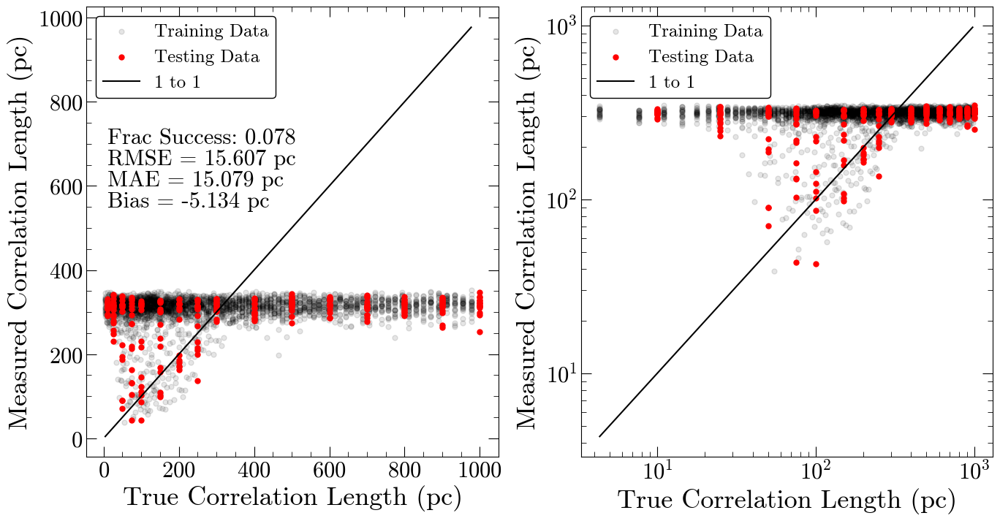

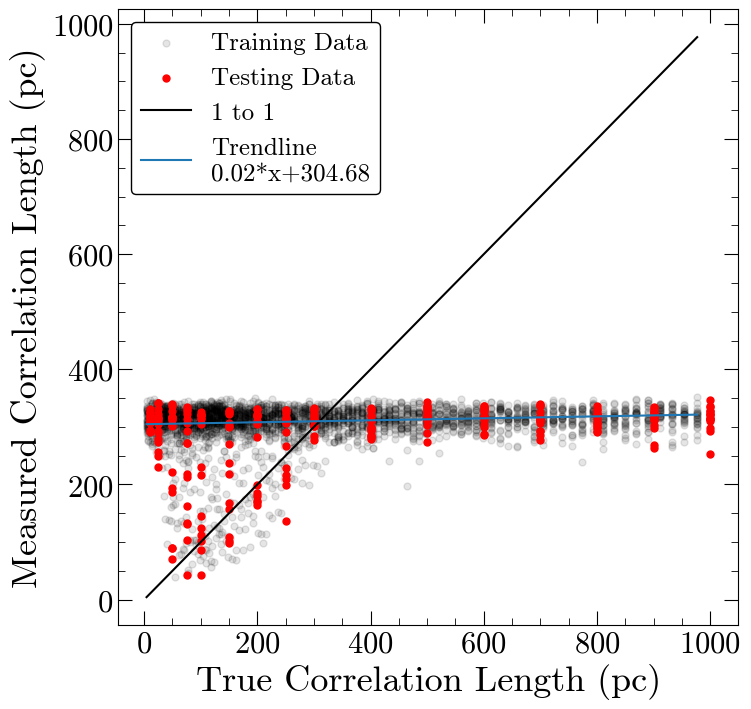

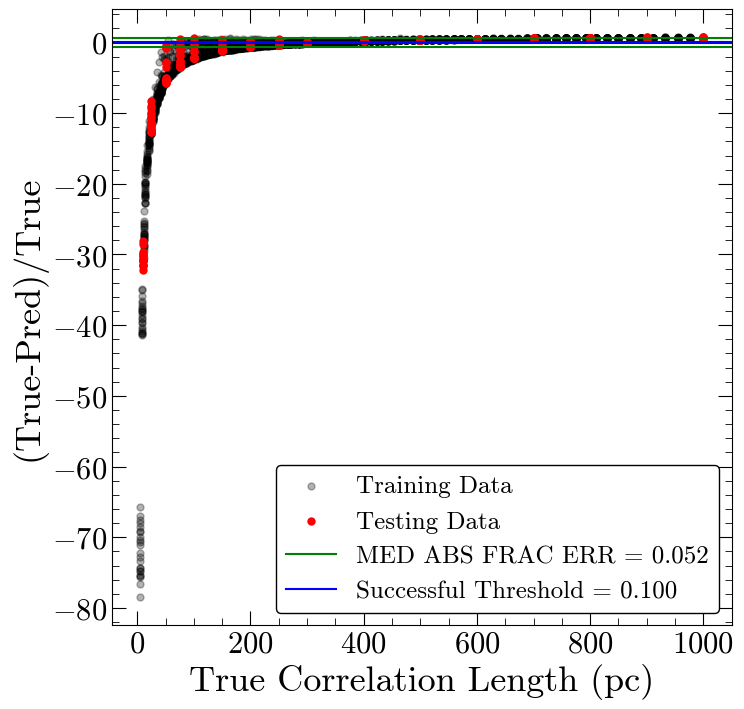

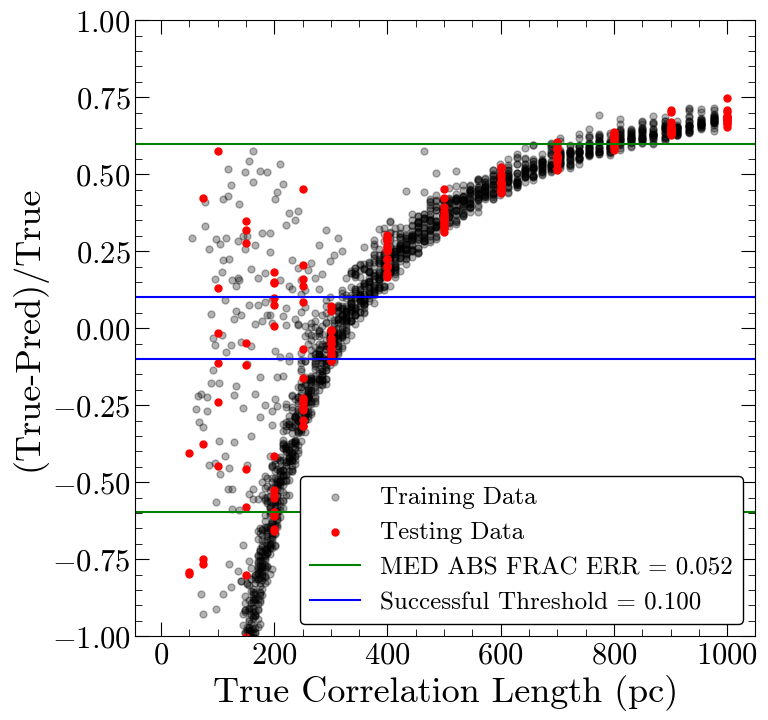

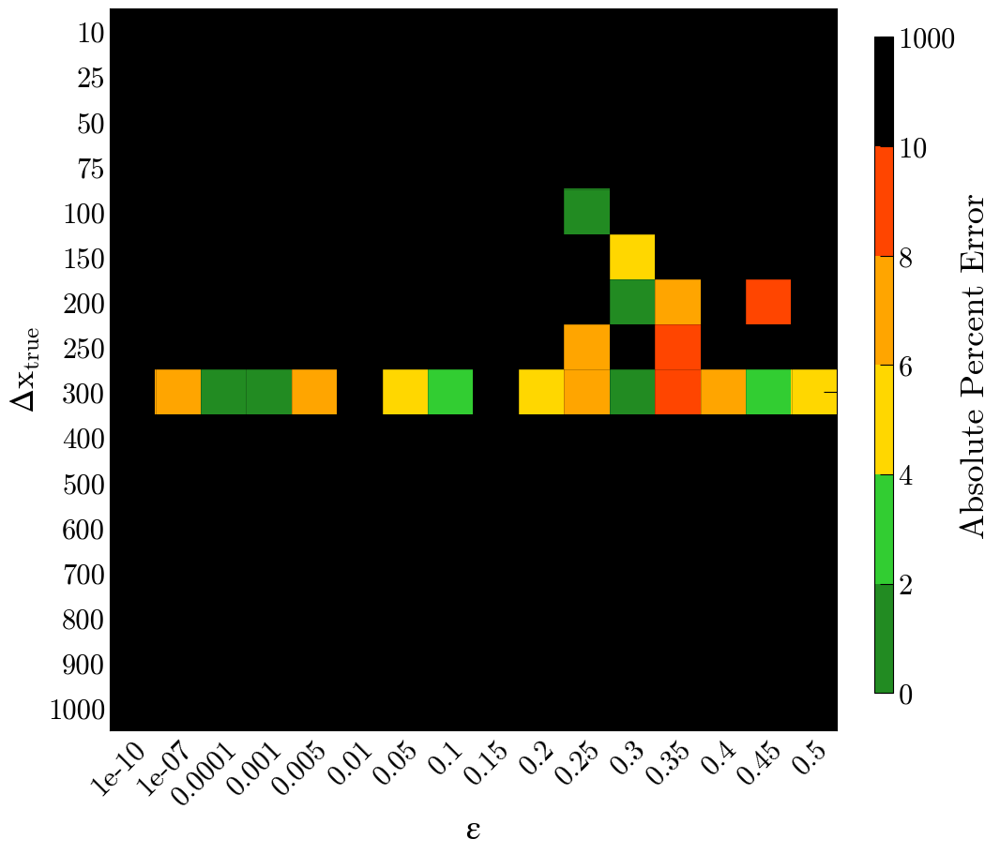

Number of squares with abs percent err>10%,  236


In [25]:
#model with more layers, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 0s 2ms/step - loss: 111762.0469
Epoch 2/100
92/92 [==============================] - 0s 3ms/step - loss: 68267.2891
Epoch 3/100
92/92 [==============================] - 0s 3ms/step - loss: 68204.1328
Epoch 4/100
92/92 [==============================] - 0s 3ms/step - loss: 67869.2812
Epoch 5/100
92/92 [==============================] - 0s 3ms/step - loss: 67923.6328
Epoch 6/100
92/92 [==============================] - 0s 3ms/step - loss: 67946.3516
Epoch 7/100
92/92 [==============================] - 0s 3ms/step - loss: 67986.3672
Epoch 8/100
92/92 [==============================] - 0s 3ms/step - loss: 67793.1562
Epoch 9/100
92/92 [==============================] - 0s 3ms/step - loss: 68193.0938
Epoch 10/100
92/92 [==============================] - 0s 3ms/step - loss: 67818.8984
Epoch 11/100
92/92 [==============================] - 0s 3ms/step - loss: 68293.5703
Epoch 12/100
92/92 [==============================] - 0s 3ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 257.160 pc
MAE: 202.492 pc
BIAS: -89.481 pc
MED FRAC ERR: 0.608 

Training Stats, Successful Fits
Frac Success Fit: 0.075 
RMSE: 19.265 pc
MAE: 15.790 pc
BIAS: 2.291 pc
MED FRAC ERR: 0.052 

Testing Stats
RMSE: 317.430 pc
MAE: 250.270 pc
BIAS: -16.369 pc
MED FRAC ERR: 0.617 

Testing Stats, Successful Fits
Frac Success Fit: 0.059 
RMSE: 13.769 pc
MAE: 10.650 pc
BIAS: -6.908 pc
MED FRAC ERR: 0.040 


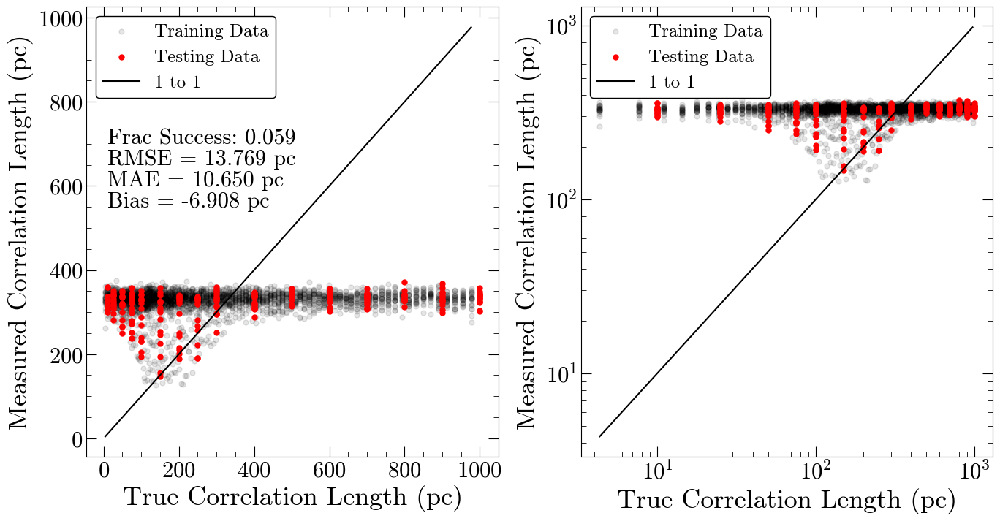

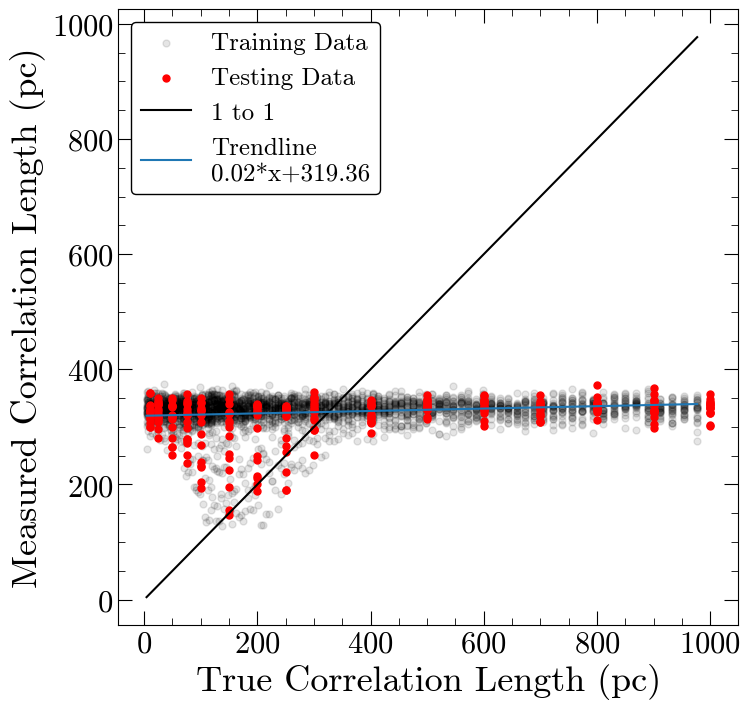

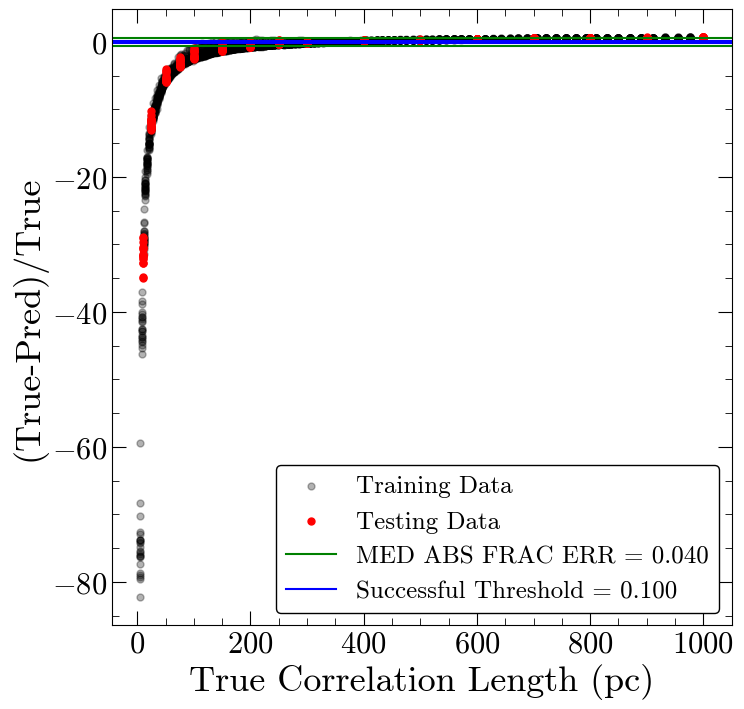

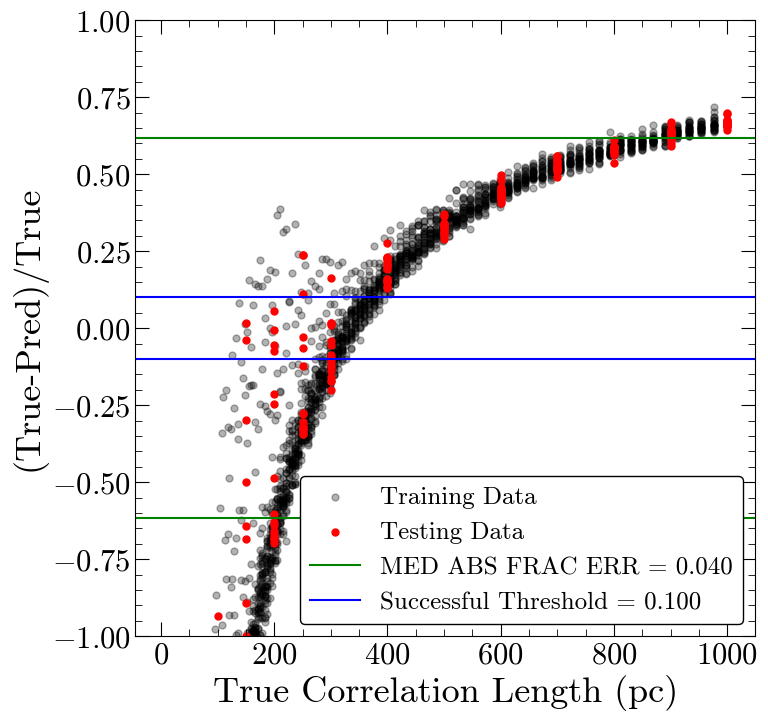

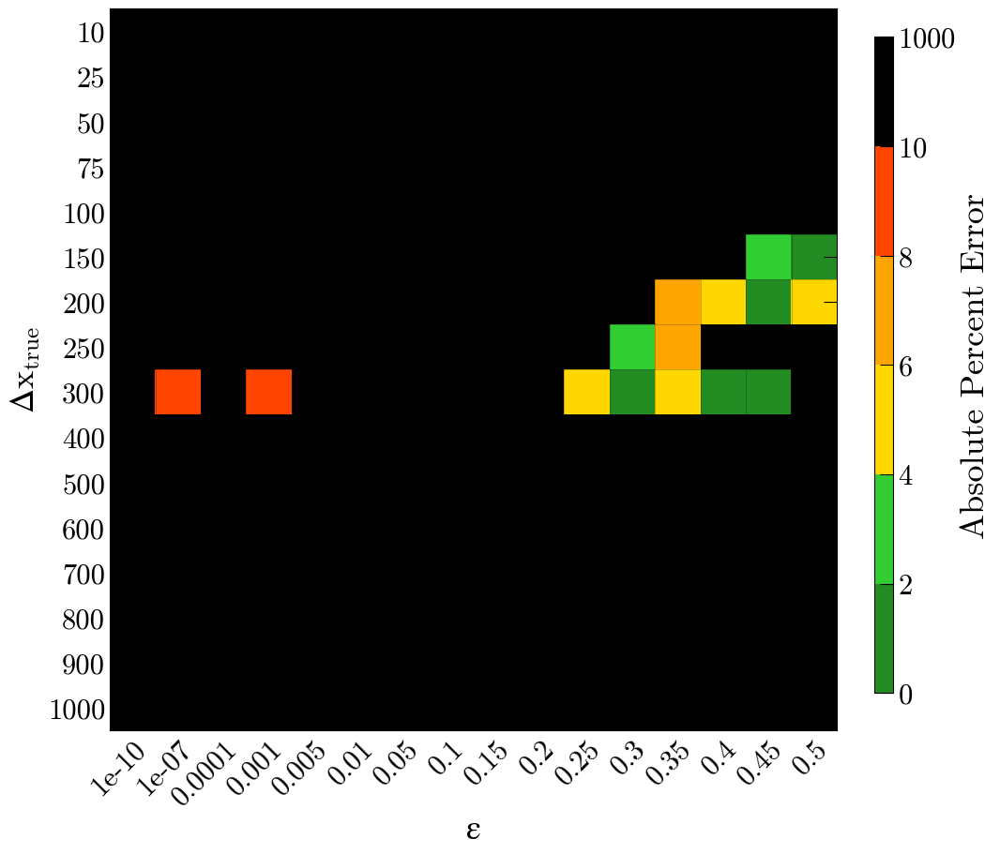

Number of squares with abs percent err>10%,  241


In [26]:
#model with more layers, increase max pooling in first layer
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 0s 2ms/step - loss: 106428.1016
Epoch 2/100
92/92 [==============================] - 0s 3ms/step - loss: 68086.5234
Epoch 3/100
92/92 [==============================] - 0s 3ms/step - loss: 67963.7422
Epoch 4/100
92/92 [==============================] - 0s 3ms/step - loss: 68293.7266
Epoch 5/100
92/92 [==============================] - 0s 3ms/step - loss: 68252.1328
Epoch 6/100
92/92 [==============================] - 0s 3ms/step - loss: 68005.6094
Epoch 7/100
92/92 [==============================] - 0s 3ms/step - loss: 68411.0391
Epoch 8/100
92/92 [==============================] - 0s 3ms/step - loss: 68102.3047
Epoch 9/100
92/92 [==============================] - 0s 3ms/step - loss: 67848.6172
Epoch 10/100
92/92 [==============================] - 0s 3ms/step - loss: 68012.7812
Epoch 11/100
92/92 [==============================] - 0s 3ms/step - loss: 67932.6797
Epoch 12/100
92/92 [==============================] - 0s 3ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 257.734 pc
MAE: 178.027 pc
BIAS: -40.771 pc
MED FRAC ERR: 0.603 

Training Stats, Successful Fits
Frac Success Fit: 0.072 
RMSE: 15.849 pc
MAE: 12.160 pc
BIAS: 2.240 pc
MED FRAC ERR: 0.045 

Testing Stats
RMSE: 327.065 pc
MAE: 216.544 pc
BIAS: 25.333 pc
MED FRAC ERR: 0.626 

Testing Stats, Successful Fits
Frac Success Fit: 0.062 
RMSE: 11.722 pc
MAE: 9.725 pc
BIAS: 5.278 pc
MED FRAC ERR: 0.037 


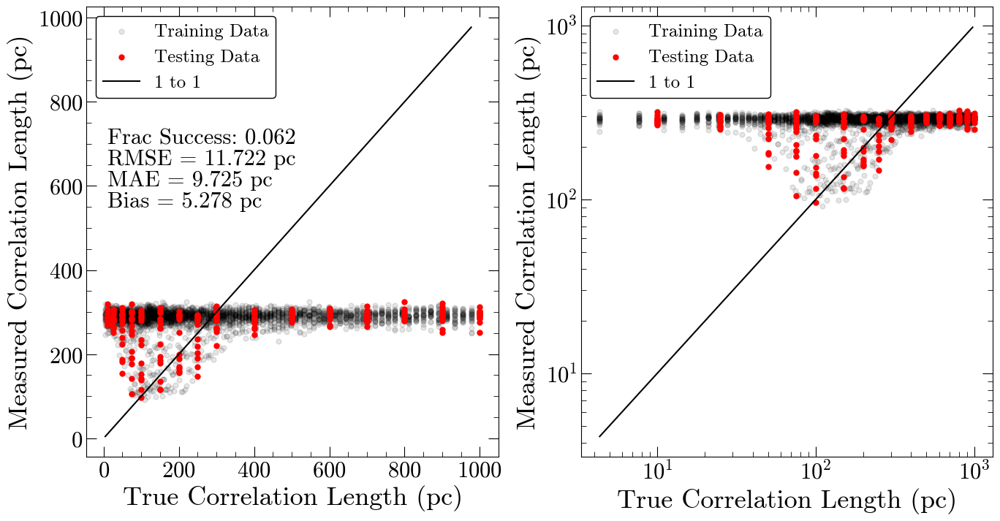

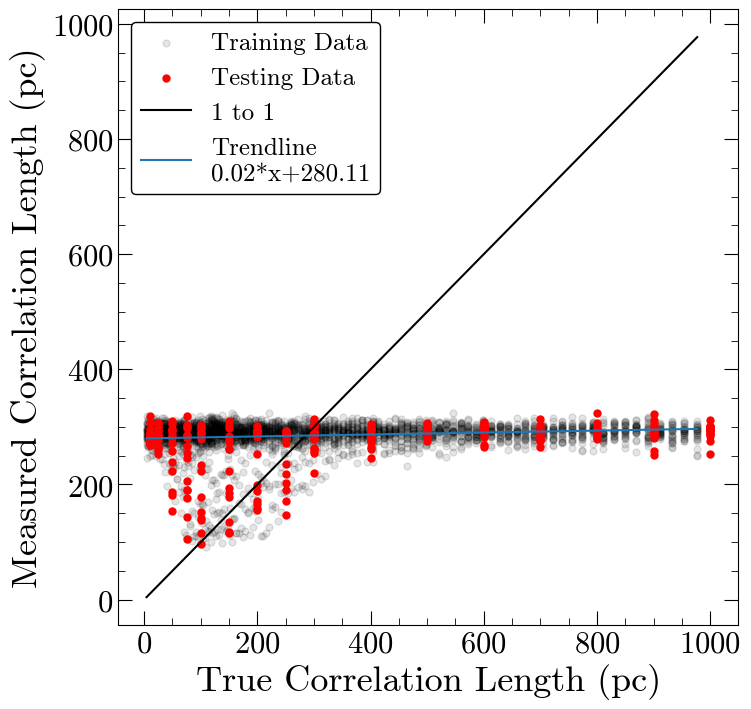

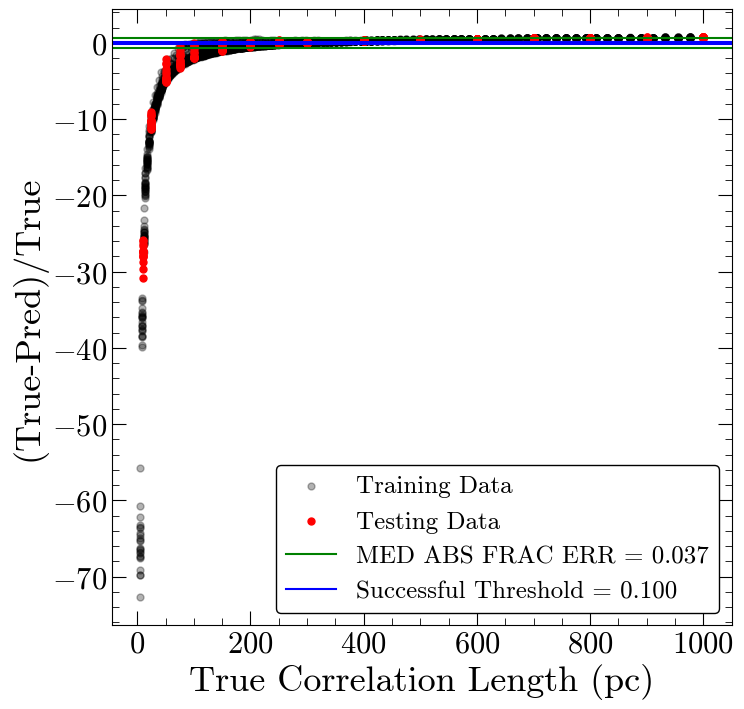

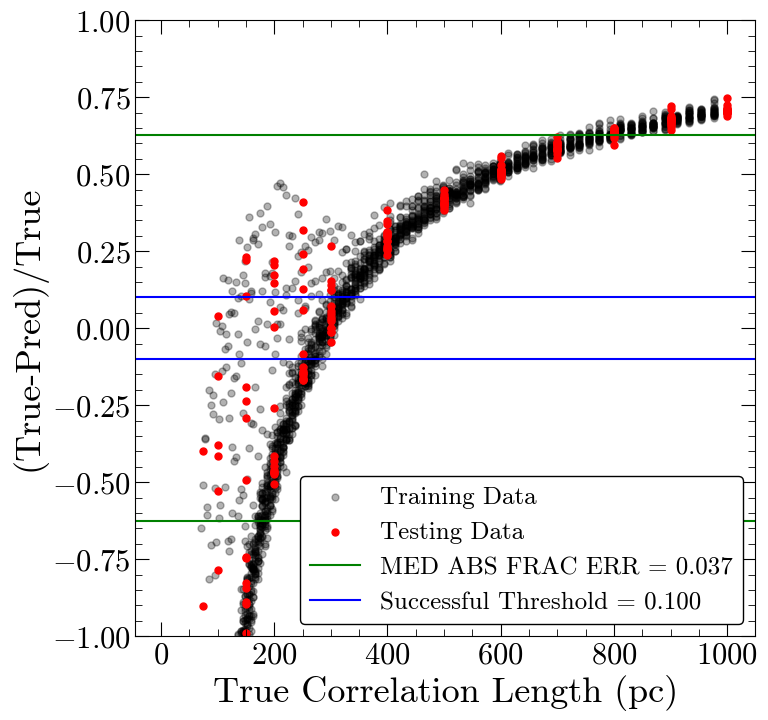

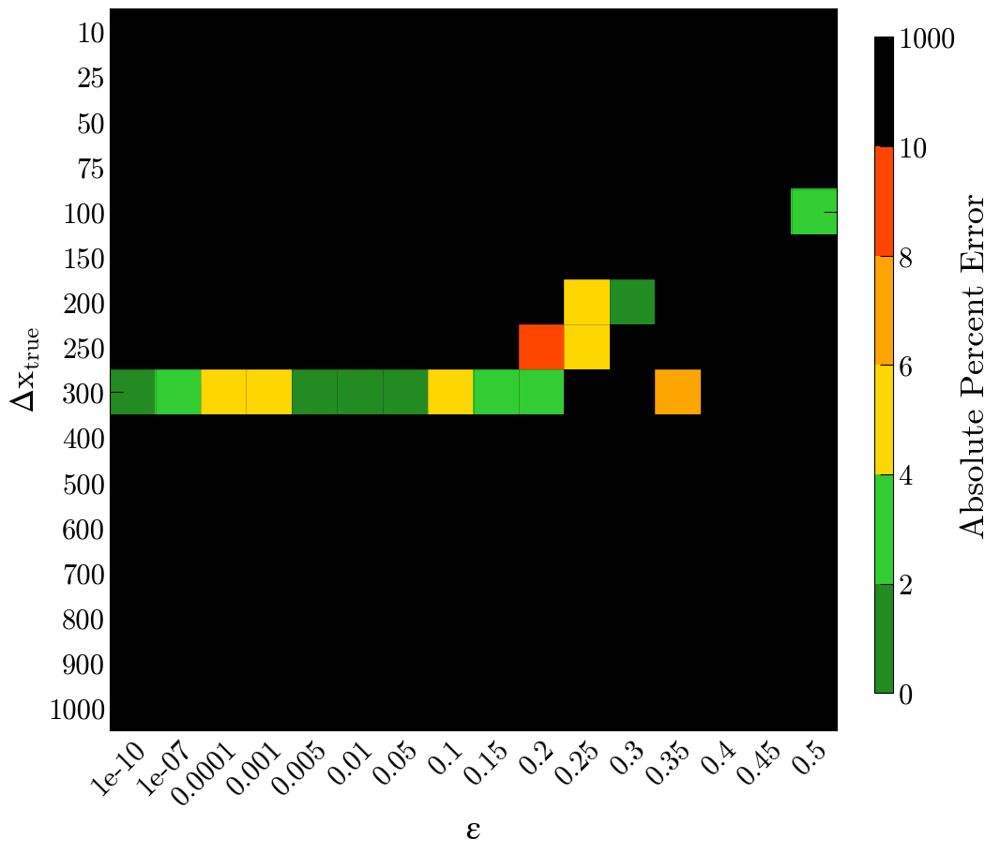

Number of squares with abs percent err>10%,  240


In [27]:
#model with more layers, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 0s 3ms/step - loss: 103014.3203
Epoch 2/200
92/92 [==============================] - 0s 3ms/step - loss: 68072.9297
Epoch 3/200
92/92 [==============================] - 0s 3ms/step - loss: 68236.2500
Epoch 4/200
92/92 [==============================] - 0s 3ms/step - loss: 67714.2578
Epoch 5/200
92/92 [==============================] - 0s 3ms/step - loss: 68409.2734
Epoch 6/200
92/92 [==============================] - 0s 3ms/step - loss: 67822.5156
Epoch 7/200
92/92 [==============================] - 0s 3ms/step - loss: 67811.7109
Epoch 8/200
92/92 [==============================] - 0s 3ms/step - loss: 67698.2188
Epoch 9/200
92/92 [==============================] - 0s 3ms/step - loss: 67946.5938
Epoch 10/200
92/92 [==============================] - 0s 3ms/step - loss: 67525.1016
Epoch 11/200
92/92 [==============================] - 0s 3ms/step - loss: 67689.2734
Epoch 12/200
92/92 [==============================] - 0s 3ms/step - loss:

92/92 [==============================] - 0s 3ms/step - loss: 65351.4609
Epoch 193/200
92/92 [==============================] - 0s 3ms/step - loss: 65505.9375
Epoch 194/200
92/92 [==============================] - 0s 3ms/step - loss: 65270.7969
Epoch 195/200
92/92 [==============================] - 0s 3ms/step - loss: 65435.4609
Epoch 196/200
92/92 [==============================] - 0s 3ms/step - loss: 65432.9492
Epoch 197/200
92/92 [==============================] - 0s 3ms/step - loss: 65417.7930
Epoch 198/200
92/92 [==============================] - 0s 3ms/step - loss: 65370.1992
Epoch 199/200
92/92 [==============================] - 0s 3ms/step - loss: 65349.5859
Epoch 200/200
92/92 [==============================] - 0s 3ms/step - loss: 65516.8789

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 255.177 pc
MAE: 192.279 pc
BIAS: -61.271 pc
MED FRAC ERR: 0.598 

Training Stats, Successful Fits
Frac Success Fit: 0.080 
RMSE: 16.970 pc
MAE: 13.016 pc
BIAS: 3.276 pc
MED FRAC ERR: 0.044 

Testing Stats
RMSE: 318.285 pc
MAE: 228.882 pc
BIAS: 10.836 pc
MED FRAC ERR: 0.597 

Testing Stats, Successful Fits
Frac Success Fit: 0.082 
RMSE: 14.627 pc
MAE: 12.083 pc
BIAS: -8.282 pc
MED FRAC ERR: 0.053 


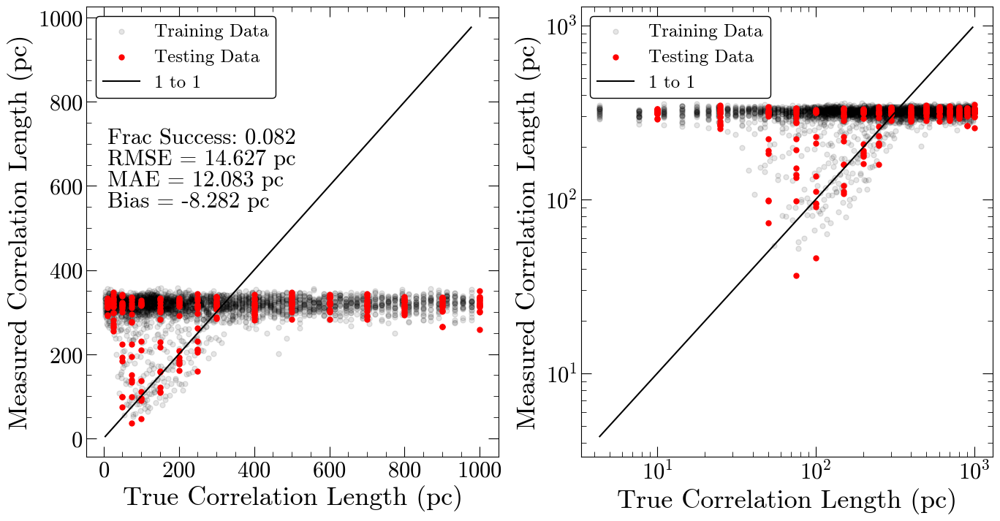

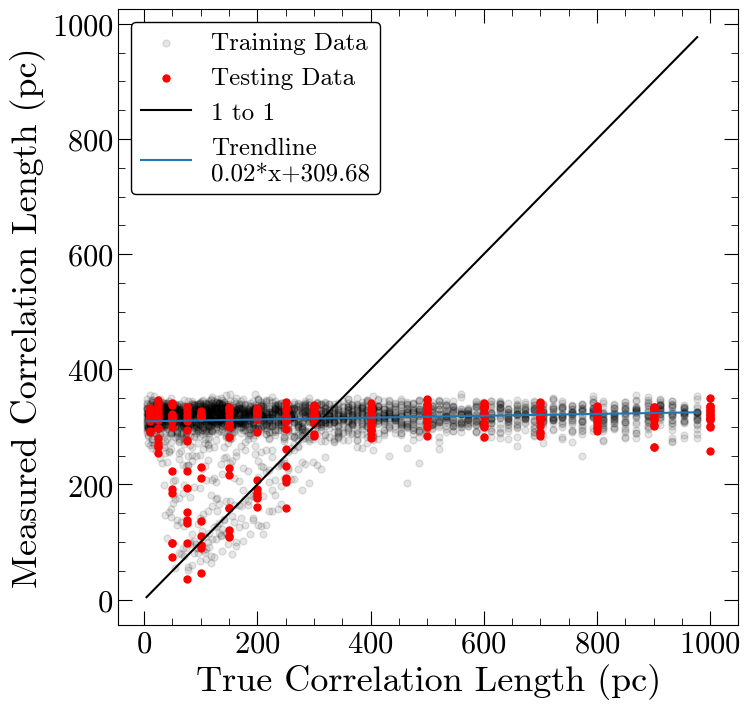

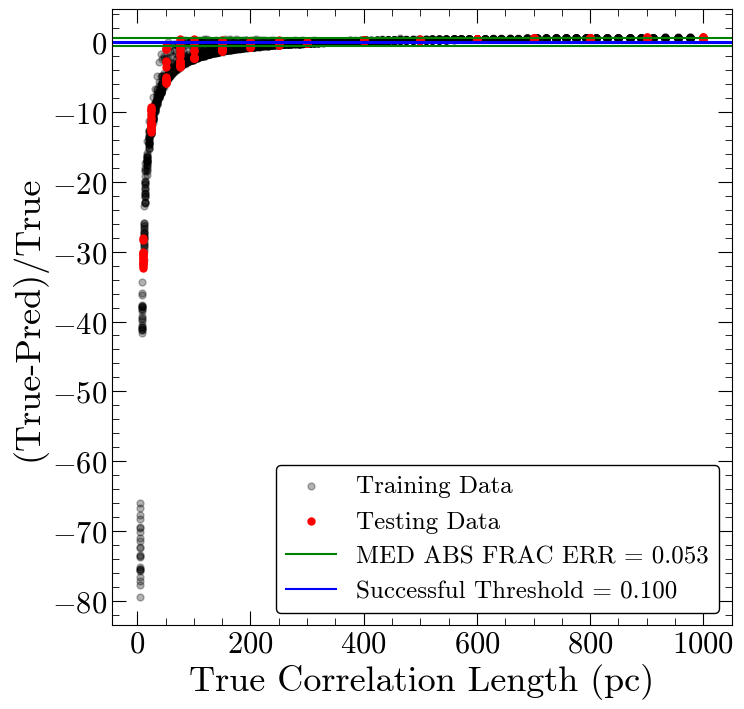

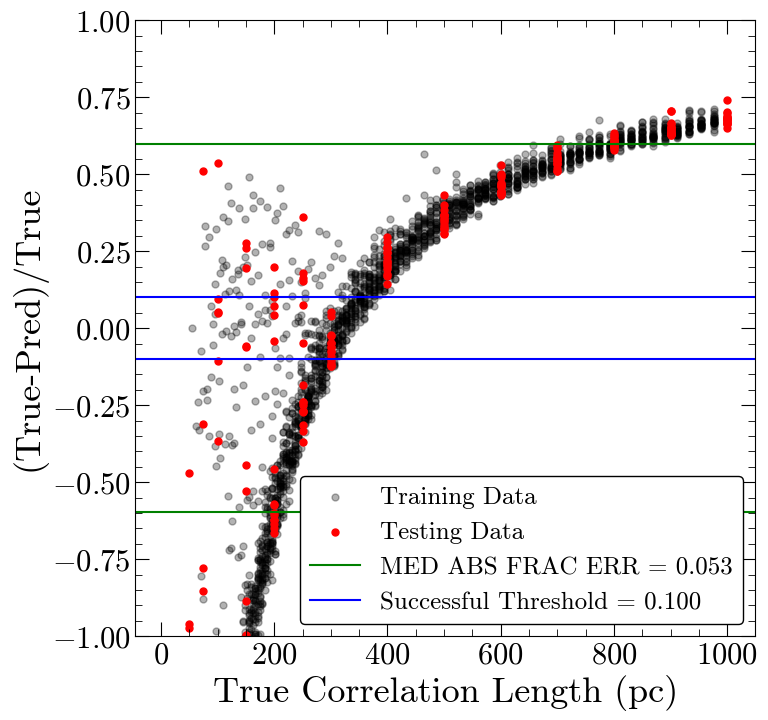

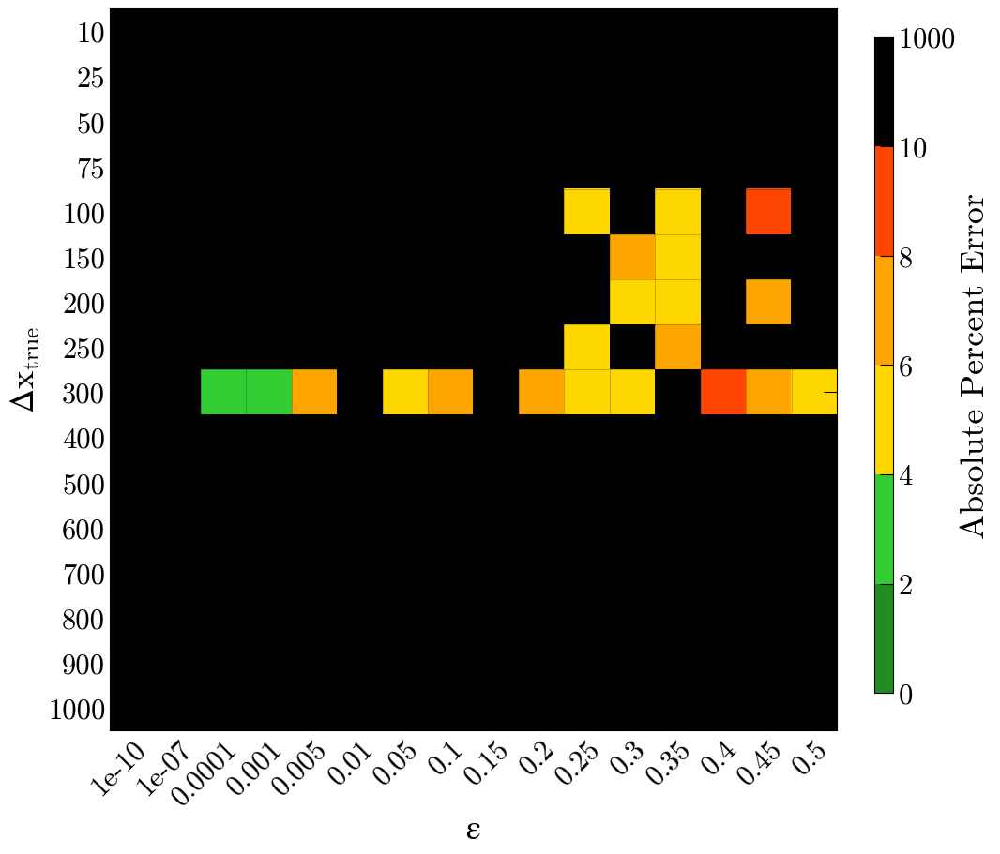

Number of squares with abs percent err>10%,  235


In [28]:
#model with more layers, run for more epochs, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 0s 3ms/step - loss: 107384.5078
Epoch 2/400
92/92 [==============================] - 0s 3ms/step - loss: 68399.0156
Epoch 3/400
92/92 [==============================] - 0s 3ms/step - loss: 68328.9766
Epoch 4/400
92/92 [==============================] - 0s 3ms/step - loss: 67898.6953
Epoch 5/400
92/92 [==============================] - 0s 3ms/step - loss: 67966.3203
Epoch 6/400
92/92 [==============================] - 0s 3ms/step - loss: 67781.1250
Epoch 7/400
92/92 [==============================] - 0s 3ms/step - loss: 67890.7266
Epoch 8/400
92/92 [==============================] - 0s 3ms/step - loss: 68014.9844
Epoch 9/400
92/92 [==============================] - 0s 3ms/step - loss: 67803.1562
Epoch 10/400
92/92 [==============================] - 0s 3ms/step - loss: 67752.4844
Epoch 11/400
92/92 [==============================] - 0s 3ms/step - loss: 67692.9297
Epoch 12/400
92/92 [==============================] - 0s 3ms/step - loss:

92/92 [==============================] - 0s 5ms/step - loss: 65415.7773
Epoch 193/400
92/92 [==============================] - 0s 5ms/step - loss: 65390.5977
Epoch 194/400
92/92 [==============================] - 0s 5ms/step - loss: 65387.3984
Epoch 195/400
92/92 [==============================] - 0s 4ms/step - loss: 65572.8125
Epoch 196/400
92/92 [==============================] - 0s 4ms/step - loss: 65575.9062
Epoch 197/400
92/92 [==============================] - 0s 4ms/step - loss: 65398.6172
Epoch 198/400
92/92 [==============================] - 0s 4ms/step - loss: 65629.4844
Epoch 199/400
92/92 [==============================] - 0s 4ms/step - loss: 65442.1367
Epoch 200/400
92/92 [==============================] - 0s 4ms/step - loss: 65344.6406
Epoch 201/400
92/92 [==============================] - 0s 4ms/step - loss: 65483.9727
Epoch 202/400
92/92 [==============================] - 0s 5ms/step - loss: 65280.3398
Epoch 203/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 5ms/step - loss: 64983.0938
Epoch 383/400
92/92 [==============================] - 0s 5ms/step - loss: 65068.6250
Epoch 384/400
92/92 [==============================] - 0s 4ms/step - loss: 65053.6016
Epoch 385/400
92/92 [==============================] - 0s 4ms/step - loss: 64795.0469
Epoch 386/400
92/92 [==============================] - 0s 4ms/step - loss: 65180.1719
Epoch 387/400
92/92 [==============================] - 0s 4ms/step - loss: 64860.3359
Epoch 388/400
92/92 [==============================] - 0s 4ms/step - loss: 64803.9062
Epoch 389/400
92/92 [==============================] - 0s 4ms/step - loss: 64880.9414
Epoch 390/400
92/92 [==============================] - 0s 4ms/step - loss: 64893.0430
Epoch 391/400
92/92 [==============================] - 0s 4ms/step - loss: 64839.5664
Epoch 392/400
92/92 [==============================] - 0s 4ms/step - loss: 65037.7578
Epoch 393/400
92/92 [==============================] - 0s 4ms/step -

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 254.744 pc
MAE: 202.606 pc
BIAS: -76.830 pc
MED FRAC ERR: 0.592 

Training Stats, Successful Fits
Frac Success Fit: 0.087 
RMSE: 17.919 pc
MAE: 14.381 pc
BIAS: 3.237 pc
MED FRAC ERR: 0.046 

Testing Stats
RMSE: 311.284 pc
MAE: 235.798 pc
BIAS: 2.221 pc
MED FRAC ERR: 0.579 

Testing Stats, Successful Fits
Frac Success Fit: 0.078 
RMSE: 11.897 pc
MAE: 7.479 pc
BIAS: 1.389 pc
MED FRAC ERR: 0.043 


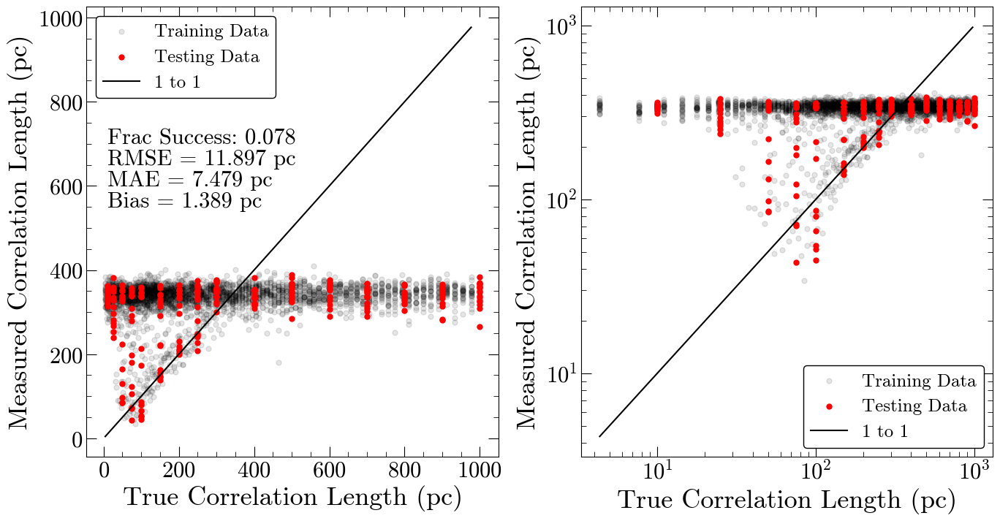

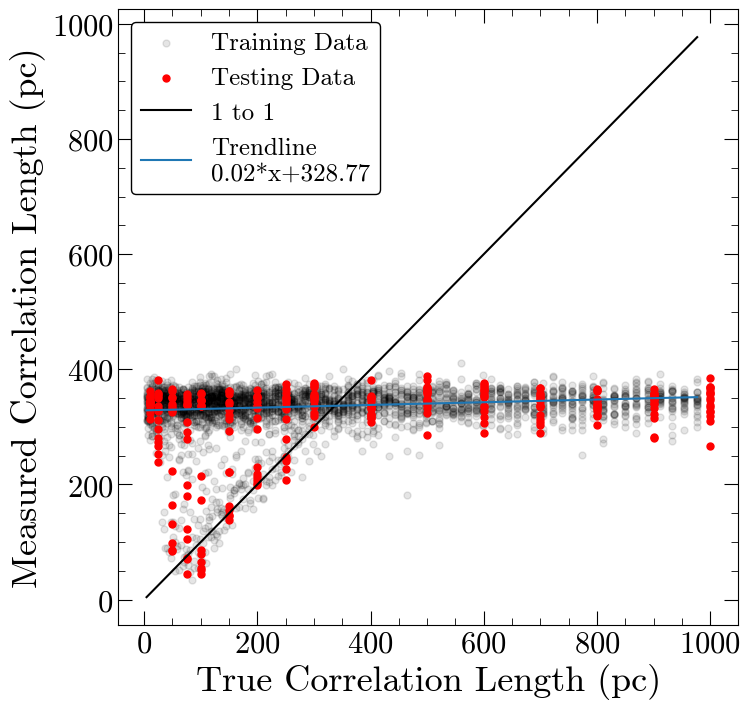

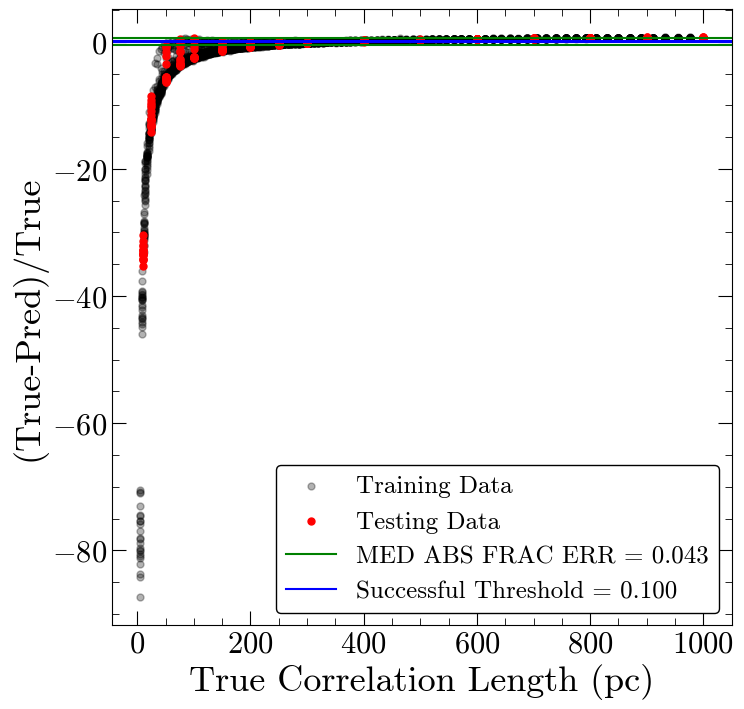

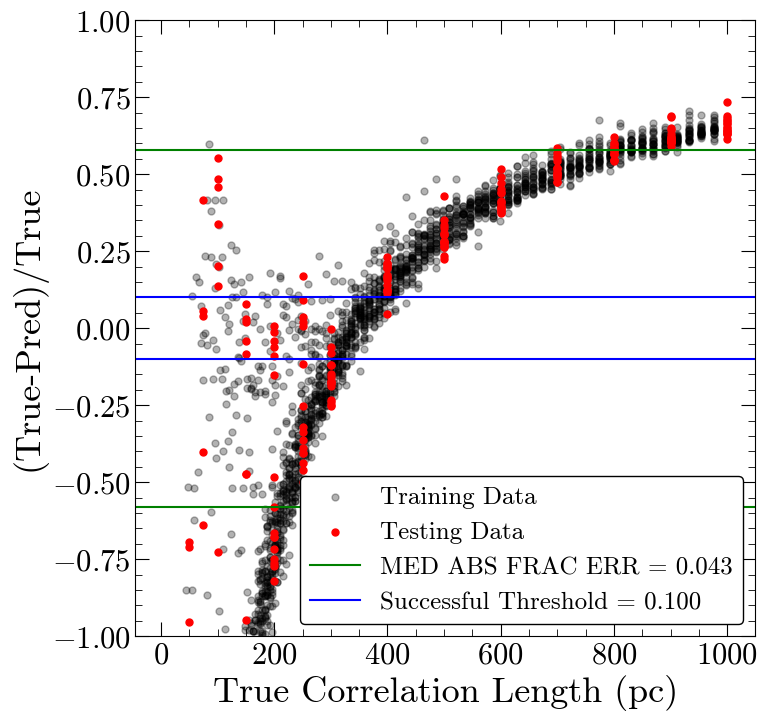

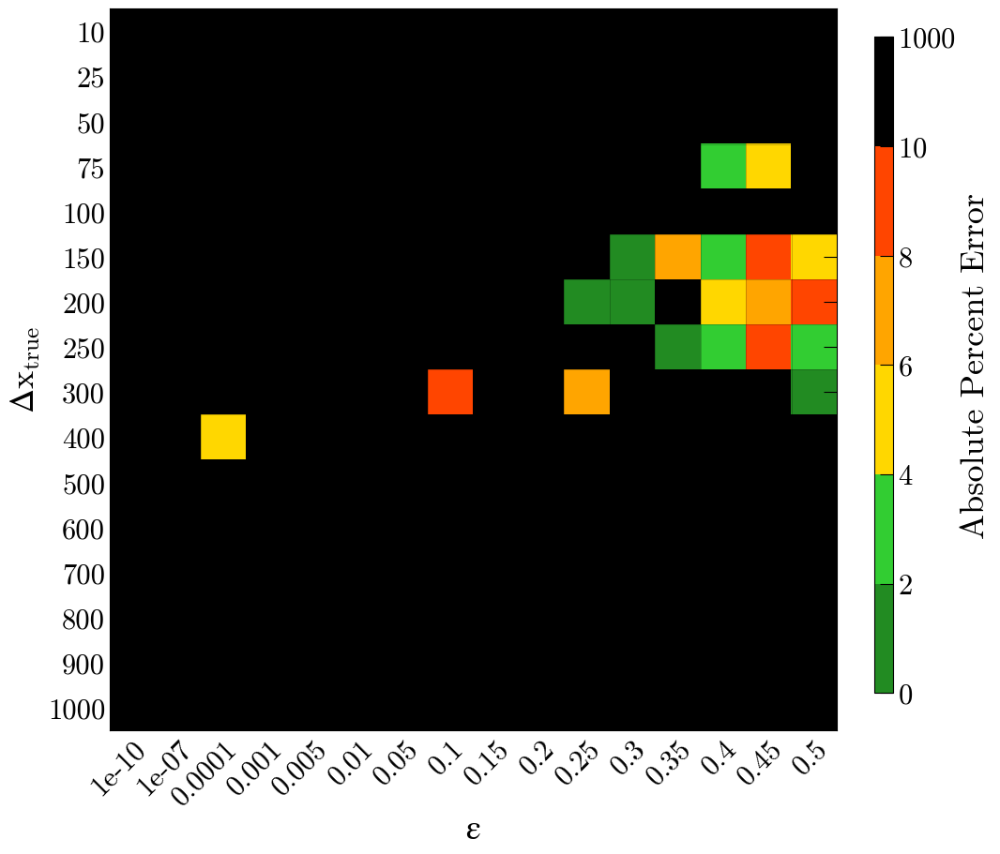

Number of squares with abs percent err>10%,  236


In [29]:
#model with more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 0s 3ms/step - loss: 100686.1250
Epoch 2/400
92/92 [==============================] - 0s 3ms/step - loss: 68181.5078
Epoch 3/400
92/92 [==============================] - 0s 4ms/step - loss: 67931.9922
Epoch 4/400
92/92 [==============================] - 0s 4ms/step - loss: 68006.1406
Epoch 5/400
92/92 [==============================] - 0s 4ms/step - loss: 68280.2031
Epoch 6/400
92/92 [==============================] - 0s 4ms/step - loss: 67918.8047
Epoch 7/400
92/92 [==============================] - 0s 4ms/step - loss: 67908.0859
Epoch 8/400
92/92 [==============================] - 0s 4ms/step - loss: 67729.7891
Epoch 9/400
92/92 [==============================] - 0s 4ms/step - loss: 68019.9062
Epoch 10/400
92/92 [==============================] - 0s 4ms/step - loss: 67798.0781
Epoch 11/400
92/92 [==============================] - 0s 4ms/step - loss: 68013.0234
Epoch 12/400
92/92 [==============================] - 0s 4ms/step - loss:

92/92 [==============================] - 0s 4ms/step - loss: 65558.1406
Epoch 193/400
92/92 [==============================] - 0s 4ms/step - loss: 65269.7188
Epoch 194/400
92/92 [==============================] - 0s 4ms/step - loss: 65231.2266
Epoch 195/400
92/92 [==============================] - 0s 4ms/step - loss: 65631.5312
Epoch 196/400
92/92 [==============================] - 0s 4ms/step - loss: 65557.4531
Epoch 197/400
92/92 [==============================] - 0s 4ms/step - loss: 65365.7422
Epoch 198/400
92/92 [==============================] - 0s 4ms/step - loss: 65538.6562
Epoch 199/400
92/92 [==============================] - 0s 4ms/step - loss: 65161.4766
Epoch 200/400
92/92 [==============================] - 0s 4ms/step - loss: 65458.2773
Epoch 201/400
92/92 [==============================] - 0s 4ms/step - loss: 65567.2109
Epoch 202/400
92/92 [==============================] - 0s 4ms/step - loss: 65564.0156
Epoch 203/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 65318.9453
Epoch 383/400
92/92 [==============================] - 0s 4ms/step - loss: 65031.5156
Epoch 384/400
92/92 [==============================] - 0s 4ms/step - loss: 64920.1055
Epoch 385/400
92/92 [==============================] - 0s 4ms/step - loss: 65042.4766
Epoch 386/400
92/92 [==============================] - 0s 4ms/step - loss: 64955.8047
Epoch 387/400
92/92 [==============================] - 0s 4ms/step - loss: 65026.0547
Epoch 388/400
92/92 [==============================] - 0s 4ms/step - loss: 64907.6875
Epoch 389/400
92/92 [==============================] - 0s 4ms/step - loss: 64931.2305
Epoch 390/400
92/92 [==============================] - 0s 4ms/step - loss: 65065.1406
Epoch 391/400
92/92 [==============================] - 0s 4ms/step - loss: 65015.7773
Epoch 392/400
92/92 [==============================] - 0s 4ms/step - loss: 64861.4766
Epoch 393/400
92/92 [==============================] - 0s 4ms/step -

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 255.351 pc
MAE: 206.941 pc
BIAS: -84.966 pc
MED FRAC ERR: 0.592 

Training Stats, Successful Fits
Frac Success Fit: 0.087 
RMSE: 19.202 pc
MAE: 15.734 pc
BIAS: -0.414 pc
MED FRAC ERR: 0.050 

Testing Stats
RMSE: 310.108 pc
MAE: 233.928 pc
BIAS: -17.120 pc
MED FRAC ERR: 0.571 

Testing Stats, Successful Fits
Frac Success Fit: 0.055 
RMSE: 19.006 pc
MAE: 15.477 pc
BIAS: -1.162 pc
MED FRAC ERR: 0.071 


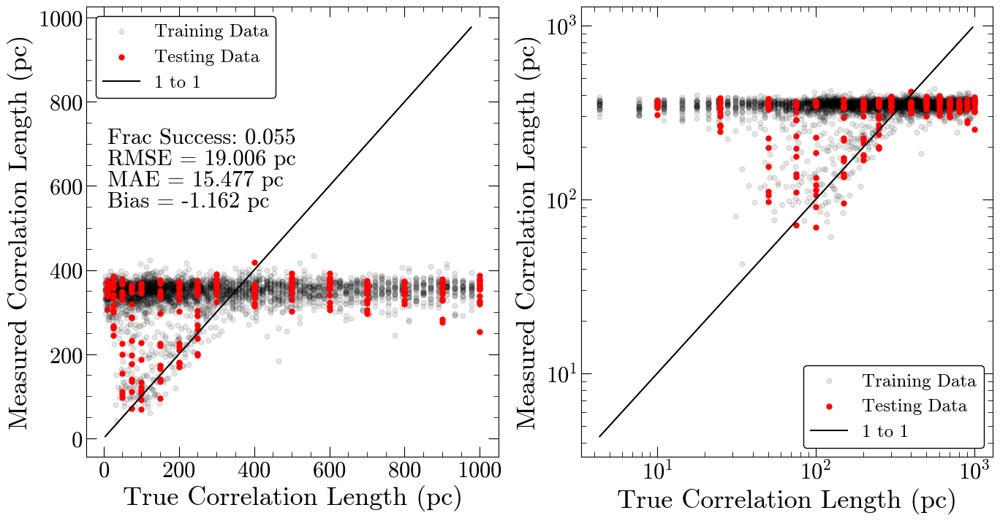

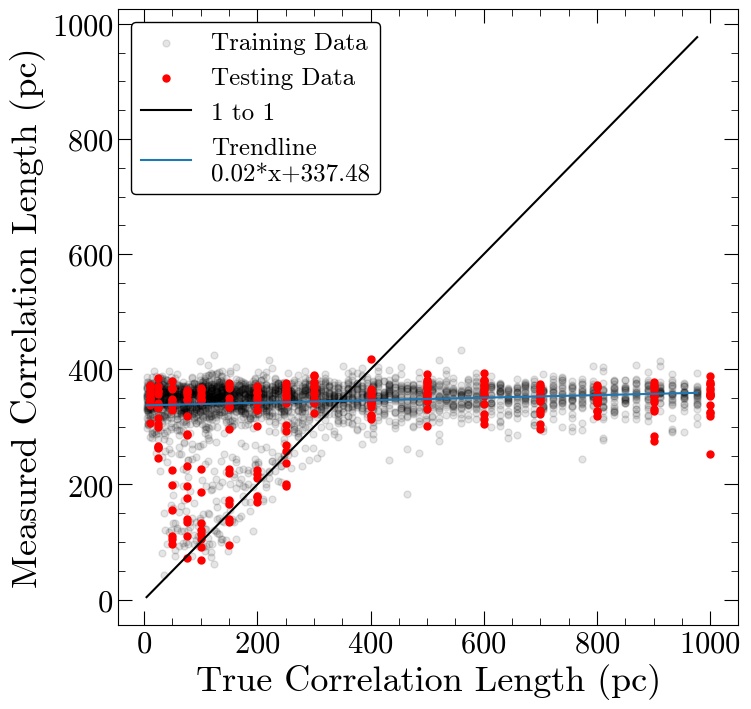

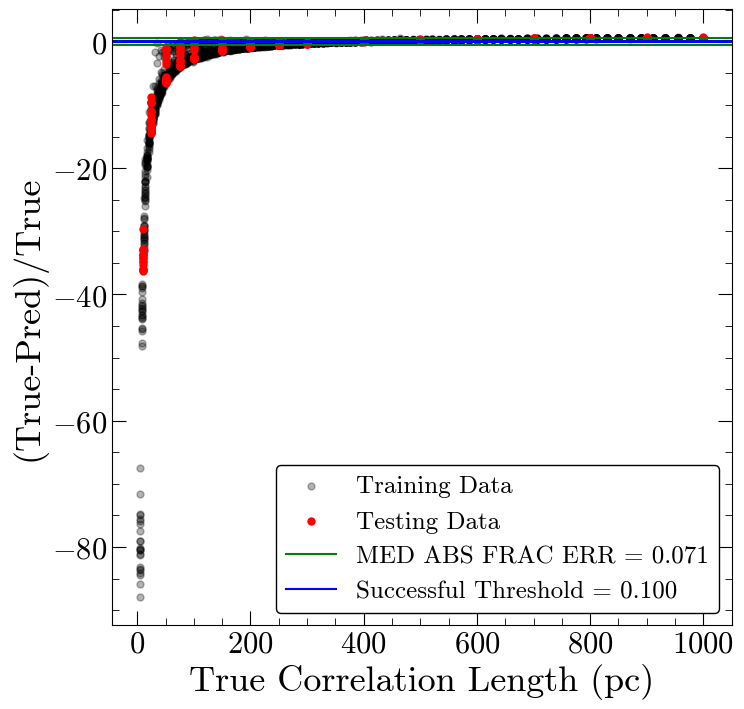

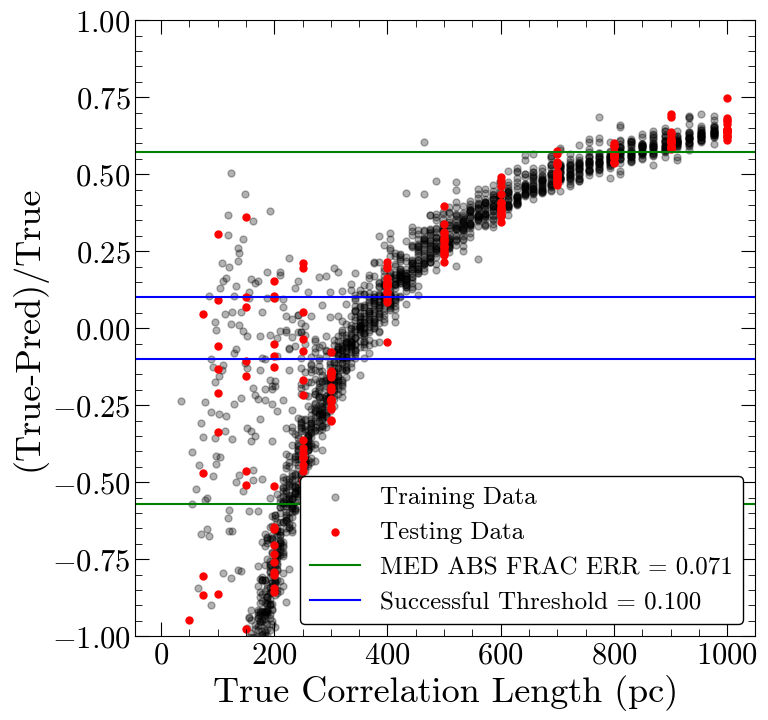

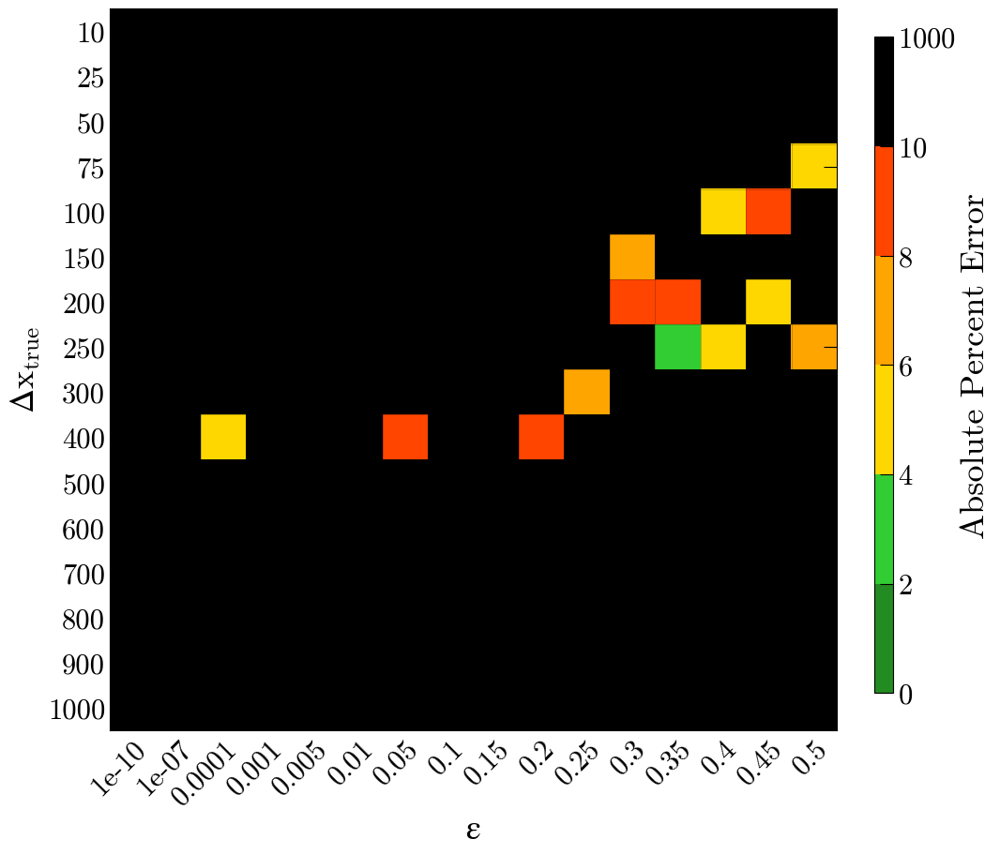

Number of squares with abs percent err>10%,  242


In [30]:
#model with even more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
46/46 [==============================] - 0s 4ms/step - loss: 151380.1250
Epoch 2/400
46/46 [==============================] - 0s 4ms/step - loss: 71010.8516
Epoch 3/400
46/46 [==============================] - 0s 4ms/step - loss: 67913.2500
Epoch 4/400
46/46 [==============================] - 0s 4ms/step - loss: 67816.6719
Epoch 5/400
46/46 [==============================] - 0s 4ms/step - loss: 67854.1484
Epoch 6/400
46/46 [==============================] - 0s 4ms/step - loss: 67887.9688
Epoch 7/400
46/46 [==============================] - 0s 4ms/step - loss: 68176.4219
Epoch 8/400
46/46 [==============================] - 0s 4ms/step - loss: 67796.9609
Epoch 9/400
46/46 [==============================] - 0s 4ms/step - loss: 68385.7656
Epoch 10/400
46/46 [==============================] - 0s 4ms/step - loss: 67854.6016
Epoch 11/400
46/46 [==============================] - 0s 4ms/step - loss: 68487.4141
Epoch 12/400
46/46 [==============================] - 0s 4ms/step - loss:

46/46 [==============================] - 0s 5ms/step - loss: 65734.5312
Epoch 193/400
46/46 [==============================] - 0s 5ms/step - loss: 65715.7656
Epoch 194/400
46/46 [==============================] - 0s 5ms/step - loss: 65654.6562
Epoch 195/400
46/46 [==============================] - 0s 4ms/step - loss: 65527.6562
Epoch 196/400
46/46 [==============================] - 0s 4ms/step - loss: 65841.2031
Epoch 197/400
46/46 [==============================] - 0s 4ms/step - loss: 65738.9375
Epoch 198/400
46/46 [==============================] - 0s 5ms/step - loss: 66044.6797
Epoch 199/400
46/46 [==============================] - 0s 5ms/step - loss: 65665.9141
Epoch 200/400
46/46 [==============================] - 0s 5ms/step - loss: 65558.7109
Epoch 201/400
46/46 [==============================] - 0s 6ms/step - loss: 65496.5117
Epoch 202/400
46/46 [==============================] - 0s 5ms/step - loss: 65624.3672
Epoch 203/400
46/46 [==============================] - 0s 4ms/step -

46/46 [==============================] - 0s 6ms/step - loss: 65564.9688
Epoch 383/400
46/46 [==============================] - 0s 6ms/step - loss: 65139.7031
Epoch 384/400
46/46 [==============================] - 0s 5ms/step - loss: 65117.3555
Epoch 385/400
46/46 [==============================] - 0s 5ms/step - loss: 65315.5312
Epoch 386/400
46/46 [==============================] - 0s 5ms/step - loss: 65104.1953
Epoch 387/400
46/46 [==============================] - 0s 5ms/step - loss: 65103.2656
Epoch 388/400
46/46 [==============================] - 0s 5ms/step - loss: 65220.6172
Epoch 389/400
46/46 [==============================] - 0s 5ms/step - loss: 65093.0625
Epoch 390/400
46/46 [==============================] - 0s 5ms/step - loss: 65183.4023
Epoch 391/400
46/46 [==============================] - 0s 5ms/step - loss: 65201.9766
Epoch 392/400
46/46 [==============================] - 0s 5ms/step - loss: 65272.9570
Epoch 393/400
46/46 [==============================] - 0s 4ms/step -

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 254.794 pc
MAE: 196.183 pc
BIAS: -66.834 pc
MED FRAC ERR: 0.597 

Training Stats, Successful Fits
Frac Success Fit: 0.089 
RMSE: 18.063 pc
MAE: 14.438 pc
BIAS: 2.073 pc
MED FRAC ERR: 0.048 

Testing Stats
RMSE: 315.616 pc
MAE: 233.010 pc
BIAS: 1.653 pc
MED FRAC ERR: 0.593 

Testing Stats, Successful Fits
Frac Success Fit: 0.082 
RMSE: 15.533 pc
MAE: 9.285 pc
BIAS: -5.695 pc
MED FRAC ERR: 0.047 


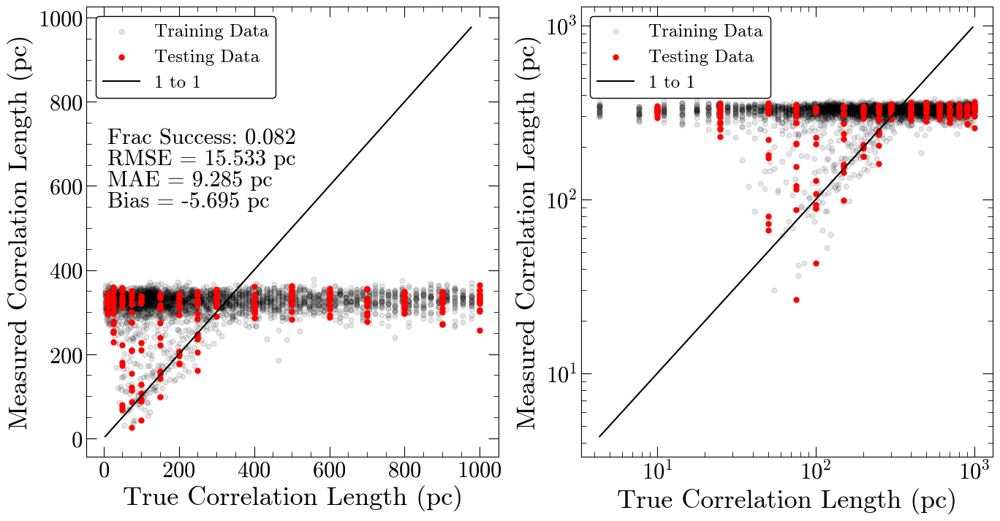

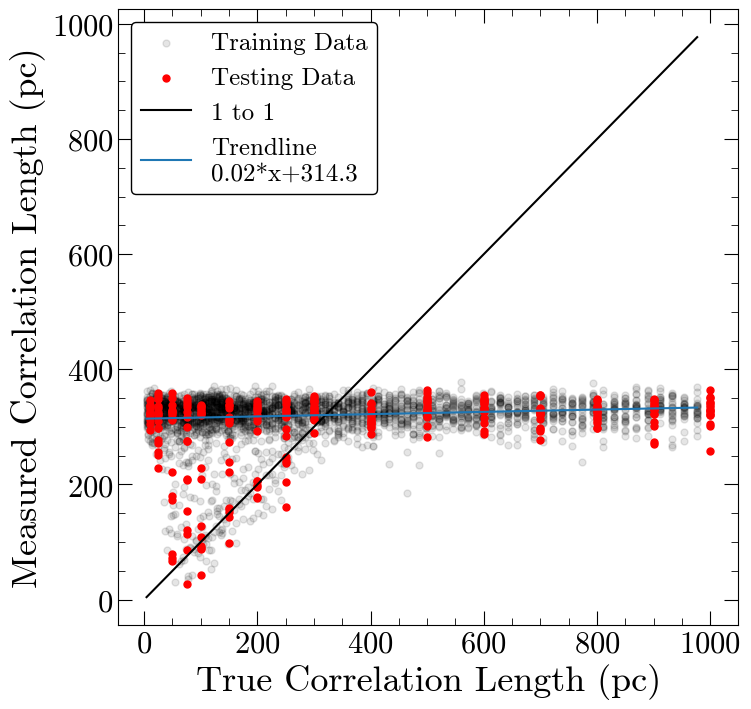

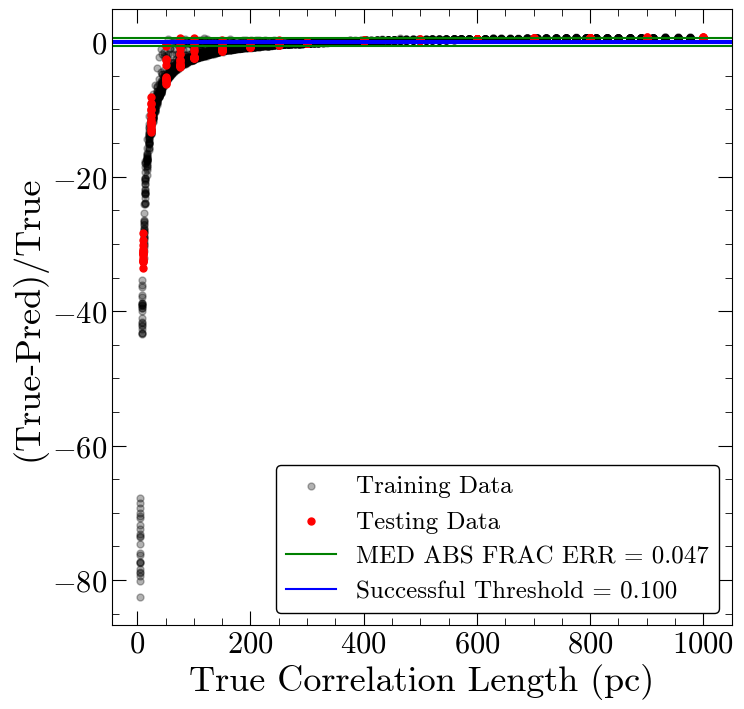

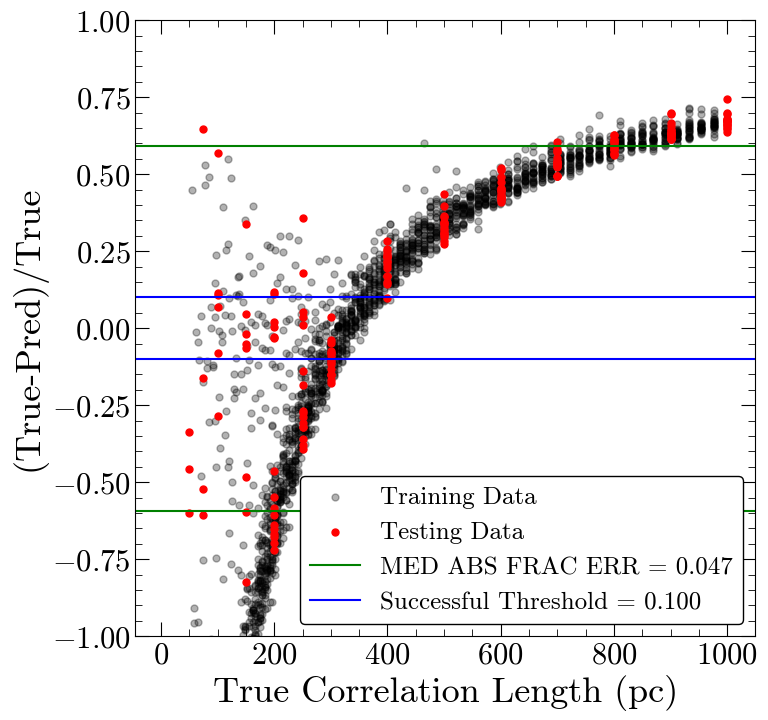

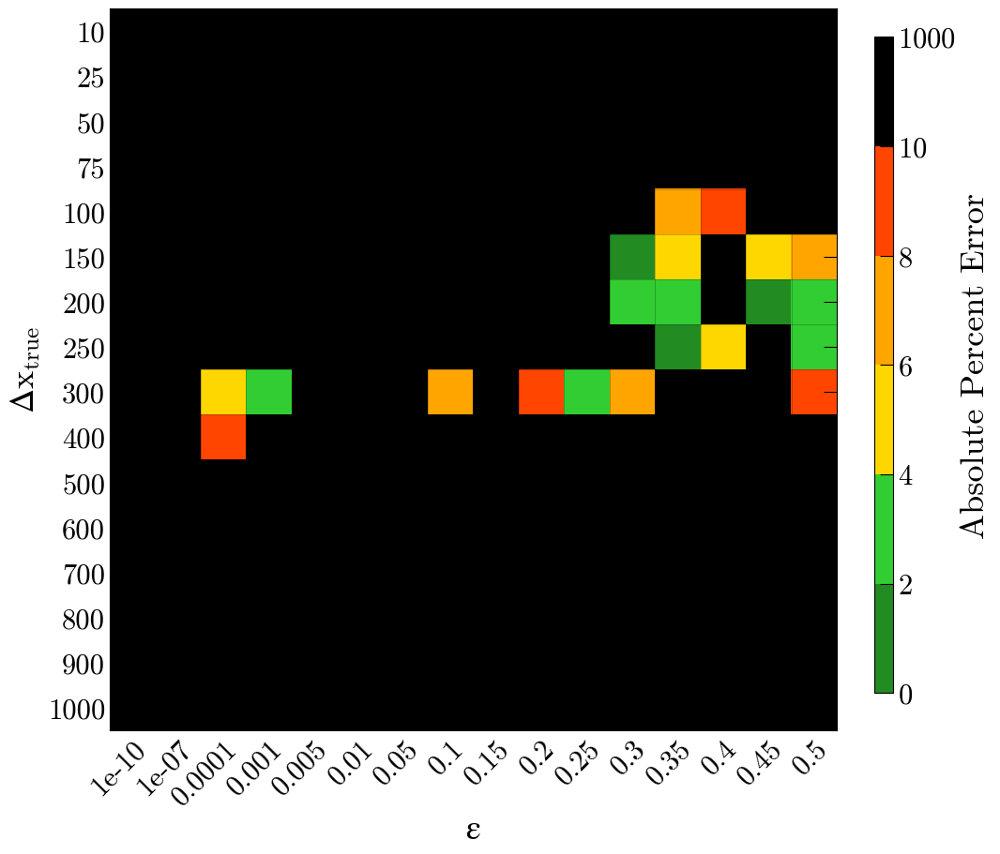

Number of squares with abs percent err>10%,  235


In [31]:
#model with even more layers, run for even more epochs, increase batch size
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=64)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
10/10 [==============================] - 0s 9ms/step - loss: 164018.8281
Epoch 2/400
10/10 [==============================] - 0s 10ms/step - loss: 160028.2969
Epoch 3/400
10/10 [==============================] - 0s 11ms/step - loss: 134680.2812
Epoch 4/400
10/10 [==============================] - 0s 11ms/step - loss: 79543.1953
Epoch 5/400
10/10 [==============================] - 0s 12ms/step - loss: 71083.3672
Epoch 6/400
10/10 [==============================] - 0s 11ms/step - loss: 69745.4375
Epoch 7/400
10/10 [==============================] - 0s 10ms/step - loss: 68381.6406
Epoch 8/400
10/10 [==============================] - 0s 11ms/step - loss: 67836.9062
Epoch 9/400
10/10 [==============================] - 0s 11ms/step - loss: 67744.6250
Epoch 10/400
10/10 [==============================] - 0s 10ms/step - loss: 67737.2266
Epoch 11/400
10/10 [==============================] - 0s 11ms/step - loss: 67789.6094
Epoch 12/400
10/10 [==============================] - 0s 11ms

10/10 [==============================] - 0s 11ms/step - loss: 65617.5469
Epoch 191/400
10/10 [==============================] - 0s 11ms/step - loss: 65634.8359
Epoch 192/400
10/10 [==============================] - 0s 12ms/step - loss: 65743.0938
Epoch 193/400
10/10 [==============================] - 0s 11ms/step - loss: 66112.2578
Epoch 194/400
10/10 [==============================] - 0s 11ms/step - loss: 65927.1875
Epoch 195/400
10/10 [==============================] - 0s 11ms/step - loss: 66307.2031
Epoch 196/400
10/10 [==============================] - 0s 11ms/step - loss: 65663.5156
Epoch 197/400
10/10 [==============================] - 0s 10ms/step - loss: 65828.7188
Epoch 198/400
10/10 [==============================] - 0s 11ms/step - loss: 65645.0938
Epoch 199/400
10/10 [==============================] - 0s 11ms/step - loss: 65752.0000
Epoch 200/400
10/10 [==============================] - 0s 11ms/step - loss: 65604.3516
Epoch 201/400
10/10 [==============================] - 0s

10/10 [==============================] - 0s 8ms/step - loss: 65462.1719
Epoch 379/400
10/10 [==============================] - 0s 8ms/step - loss: 65309.3438
Epoch 380/400
10/10 [==============================] - 0s 8ms/step - loss: 65585.9766
Epoch 381/400
10/10 [==============================] - 0s 9ms/step - loss: 65431.4922
Epoch 382/400
10/10 [==============================] - 0s 8ms/step - loss: 65217.7188
Epoch 383/400
10/10 [==============================] - 0s 8ms/step - loss: 65339.7617
Epoch 384/400
10/10 [==============================] - 0s 8ms/step - loss: 65269.1758
Epoch 385/400
10/10 [==============================] - 0s 9ms/step - loss: 65802.3750
Epoch 386/400
10/10 [==============================] - 0s 9ms/step - loss: 65751.8359
Epoch 387/400
10/10 [==============================] - 0s 8ms/step - loss: 65458.2070
Epoch 388/400
10/10 [==============================] - 0s 8ms/step - loss: 65453.9531
Epoch 389/400
10/10 [==============================] - 0s 9ms/step -

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 255.564 pc
MAE: 188.768 pc
BIAS: -57.323 pc
MED FRAC ERR: 0.599 

Training Stats, Successful Fits
Frac Success Fit: 0.080 
RMSE: 17.533 pc
MAE: 14.118 pc
BIAS: 2.698 pc
MED FRAC ERR: 0.048 

Testing Stats
RMSE: 320.244 pc
MAE: 220.078 pc
BIAS: 21.402 pc
MED FRAC ERR: 0.600 

Testing Stats, Successful Fits
Frac Success Fit: 0.078 
RMSE: 16.327 pc
MAE: 15.499 pc
BIAS: -7.878 pc
MED FRAC ERR: 0.052 


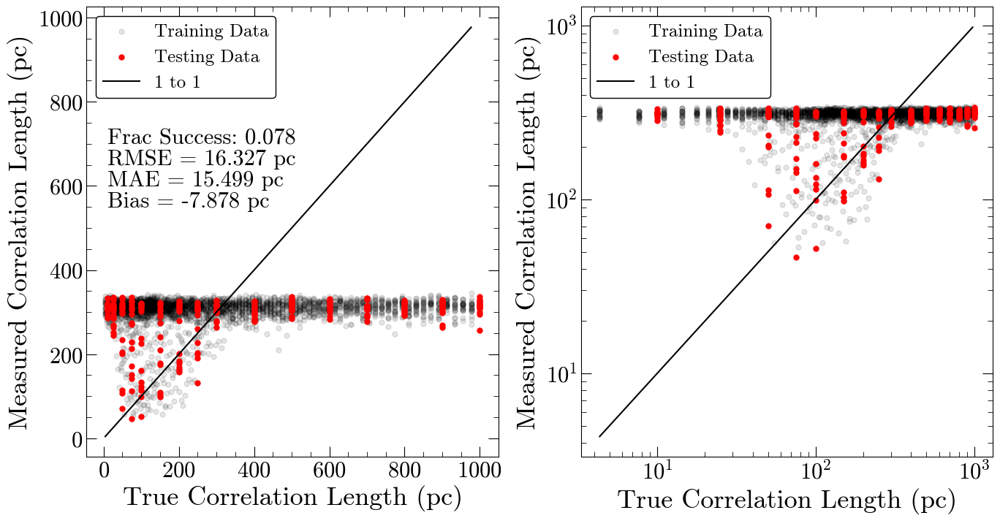

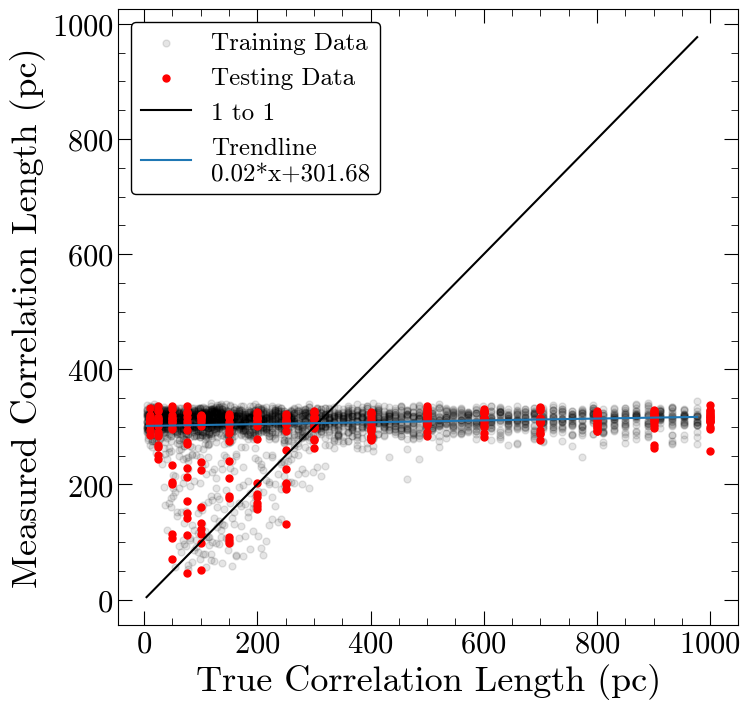

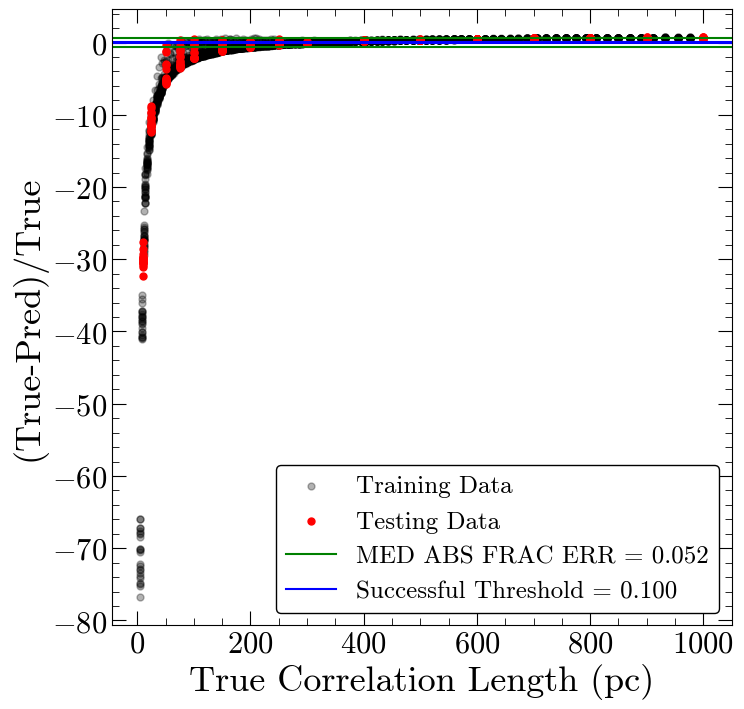

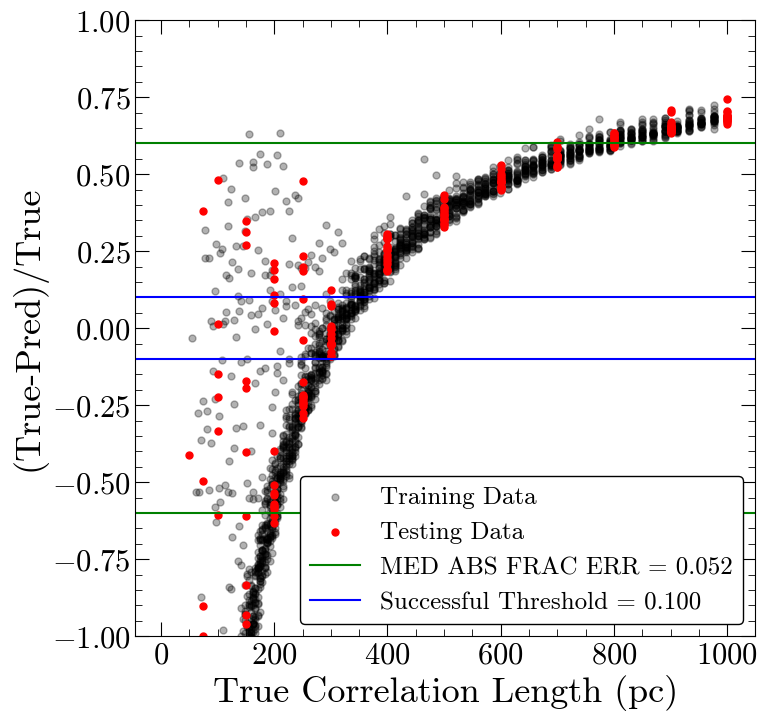

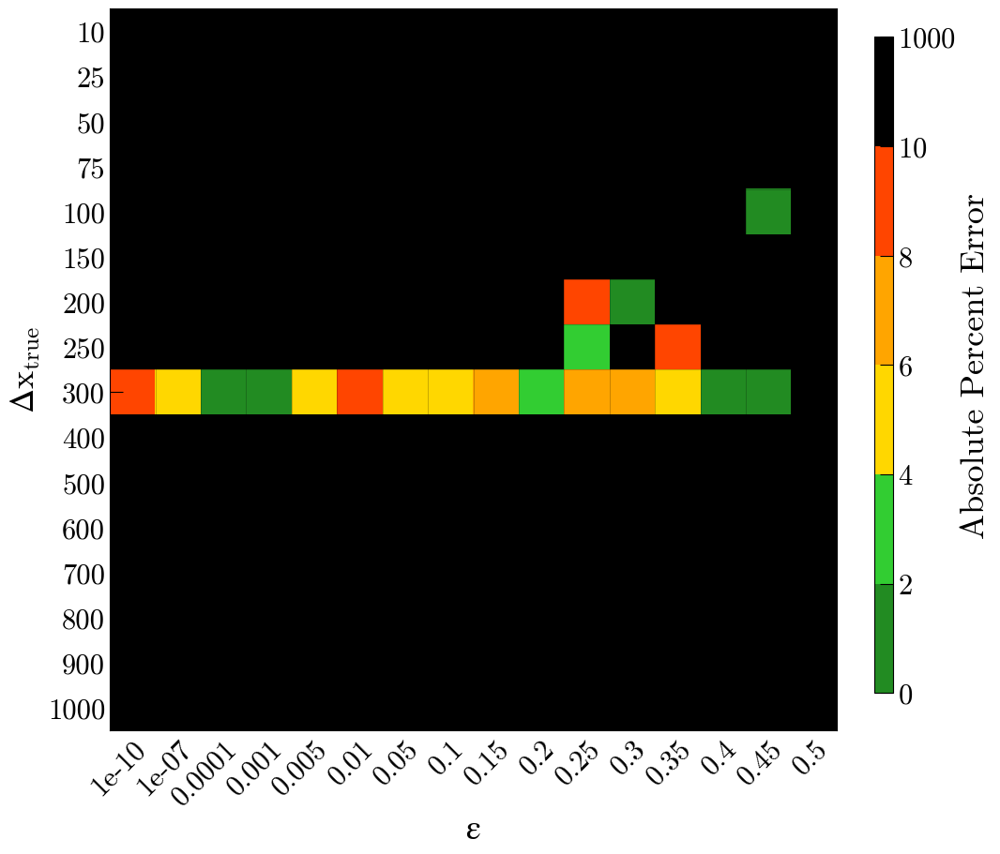

Number of squares with abs percent err>10%,  236


In [32]:
#model with even more layers, run for even more epochs, increase batch size even more
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=300)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

# Save best model

In [33]:
#reset the indices
indices=np.arange(0,len(all_model_stats))
all_model_stats.set_index(indices,inplace=True)
#round all values
all_model_stats=all_model_stats.round(2)

print('Min MAE Training')
print(all_model_stats['mae_training'].idxmin(),', min val=',min(all_model_stats['mae_training']))
print('')

print('Max Frac Success Training')
print(all_model_stats['frac_success_training'].idxmax(),', max val=',max(all_model_stats['frac_success_training']))
print('')

print('Min MAE Testing')
print(all_model_stats['mae_testing'].idxmin(),', min val=',min(all_model_stats['mae_testing']))
print('')

print('Max Frac Success Testing')
print(all_model_stats['frac_success_testing'].idxmax(),', max val=',max(all_model_stats['frac_success_testing']))
print('')

display(all_model_stats)

#best model option is 0


Min MAE Training
5 , min val= 178.03

Max Frac Success Training
7 , max val= 0.09

Min MAE Testing
2 , min val= 216.05

Max Frac Success Testing
0 , max val= 0.09



,mae_training,frac_success_training,mae_testing,frac_success_testing
0,193.52,0.07,236.84,0.09
1,182.28,0.07,218.97,0.07
2,179.18,0.07,216.05,0.06
3,190.30,0.08,224.98,0.08
4,202.49,0.08,250.27,0.06
5,178.03,0.07,216.54,0.06
6,192.28,0.08,228.88,0.08
7,202.61,0.09,235.80,0.08
8,206.94,0.09,233.93,0.05
9,196.18,0.09,233.01,0.08


In [41]:
#choose model 8 which is the best option across all runs

failed_fit_region_count=500

while failed_fit_region_count>238:
    #model with even more layers, run for even more epochs
    final_model = Sequential([
        Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
        MaxPooling1D(2), 
        Conv1D(64, 3, activation='relu'),
        MaxPooling1D(2), 
        Conv1D(128, 3, activation='relu'), 
        MaxPooling1D(2), 
        Flatten(), 
        Dense(128, activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1) 
    ])

    final_model.compile(optimizer='adam', loss='mse')

    final_model.fit(x_train, y_train, epochs=400, batch_size=32)

    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(final_model,stats=False,plot=False)
    
    print('')
    print(failed_fit_region_count)
    print('')

Epoch 1/400
92/92 [==============================] - 1s 6ms/step - loss: 99531.8203
Epoch 2/400
92/92 [==============================] - 1s 7ms/step - loss: 67988.2812
Epoch 3/400
92/92 [==============================] - 1s 10ms/step - loss: 68329.5859
Epoch 4/400
92/92 [==============================] - 1s 10ms/step - loss: 68274.0391
Epoch 5/400
92/92 [==============================] - 1s 13ms/step - loss: 68200.4922
Epoch 6/400
92/92 [==============================] - 1s 10ms/step - loss: 68323.1250
Epoch 7/400
92/92 [==============================] - 1s 8ms/step - loss: 68953.1406
Epoch 8/400
92/92 [==============================] - 1s 7ms/step - loss: 68136.7578
Epoch 9/400
92/92 [==============================] - 1s 9ms/step - loss: 68229.6250
Epoch 10/400
92/92 [==============================] - 1s 8ms/step - loss: 67971.3672
Epoch 11/400
92/92 [==============================] - 1s 9ms/step - loss: 67657.0781
Epoch 12/400
92/92 [==============================] - 1s 9ms/step - lo

92/92 [==============================] - 1s 6ms/step - loss: 65523.3789
Epoch 193/400
92/92 [==============================] - 1s 5ms/step - loss: 65360.8281
Epoch 194/400
92/92 [==============================] - 0s 5ms/step - loss: 65091.2227
Epoch 195/400
92/92 [==============================] - 0s 5ms/step - loss: 65419.7617
Epoch 196/400
92/92 [==============================] - 0s 5ms/step - loss: 65748.6641
Epoch 197/400
92/92 [==============================] - 0s 5ms/step - loss: 65536.9375
Epoch 198/400
92/92 [==============================] - 0s 5ms/step - loss: 65240.4922
Epoch 199/400
92/92 [==============================] - 0s 5ms/step - loss: 65253.8047
Epoch 200/400
92/92 [==============================] - 1s 6ms/step - loss: 65954.3828
Epoch 201/400
92/92 [==============================] - 0s 5ms/step - loss: 65450.6758
Epoch 202/400
92/92 [==============================] - 0s 5ms/step - loss: 65158.2812
Epoch 203/400
92/92 [==============================] - 1s 6ms/step -

92/92 [==============================] - 0s 5ms/step - loss: 64807.7852
Epoch 383/400
92/92 [==============================] - 1s 6ms/step - loss: 65004.6797
Epoch 384/400
92/92 [==============================] - 1s 6ms/step - loss: 65224.6016
Epoch 385/400
92/92 [==============================] - 1s 6ms/step - loss: 65323.9844
Epoch 386/400
92/92 [==============================] - 0s 5ms/step - loss: 65037.3164
Epoch 387/400
92/92 [==============================] - 0s 5ms/step - loss: 64978.1133
Epoch 388/400
92/92 [==============================] - 0s 5ms/step - loss: 64922.5352
Epoch 389/400
92/92 [==============================] - 0s 5ms/step - loss: 64644.8320
Epoch 390/400
92/92 [==============================] - 0s 5ms/step - loss: 64641.7930
Epoch 391/400
92/92 [==============================] - 0s 5ms/step - loss: 65030.8086
Epoch 392/400
92/92 [==============================] - 0s 5ms/step - loss: 64762.1758
Epoch 393/400
92/92 [==============================] - 0s 5ms/step -

In [42]:
#save the model
nb='10'
final_model.save('csv/nb05_sample_size_10207/'+nb+'_final_model')

INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/10_final_model/assets


INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/10_final_model/assets


In [43]:
def final_plot(nb,title,statx=10,staty=700,statdy=50,lim='default', siegel=True,success_fit_threshold=0.1):
    
    loaded_model = load_model('csv/nb05_sample_size_10207/'+nb+'_final_model')
    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(loaded_model,stats=False,plot=False)
    
    # use the model to predict the training data
    y_pred_train = loaded_model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the training data
    y_pred_test = loaded_model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,False)
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,False,True,success_fit_threshold)
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,False)
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold)
    
    #plot the agreement with stats
    fig, ((ax1),(ax2)) =plt.subplots(2,1,figsize=(8,16),sharex=True)
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_ylabel(r'Predicted Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    
    # plot the fractional error between the datasets zoomed in
    ax2.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax2.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax2.axhline(0,color='black')
    ax2.axhline(med_frac_testing,color='green',label='Median Absolute\nFractional Error = {:.3f}'.format(med_frac_testing_success))
    ax2.axhline(-med_frac_testing,color='green')
    ax2.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.1f}'.format(success_fit_threshold))
    ax2.axhline(-success_fit_threshold,color='blue')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'($\lambda_{True}-\lambda_{Pred})/\lambda_{True}$')
    ax2.set_ylim((-1,1))
    ax2.legend()
    
    ax1.set_title(title)
    
    plt.subplots_adjust(wspace = 0,hspace=0)
    plt.show()
    
    #make and save the heatmap, which is the figure that will be included in the paper
    failed_fit_region_count=heatmap_testing_data(testing_data,title,savefig=True,figname=nb+'_cnn_heatmap')
    

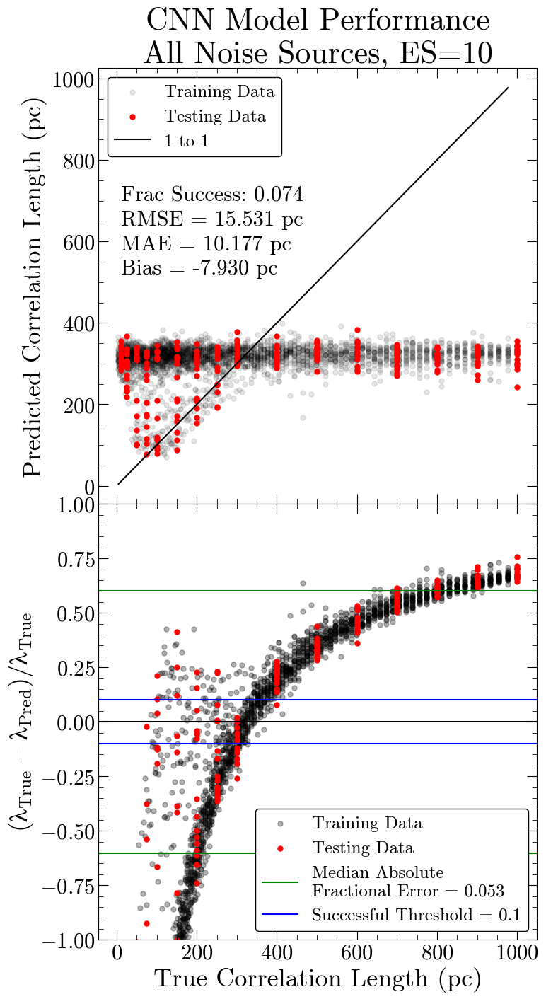

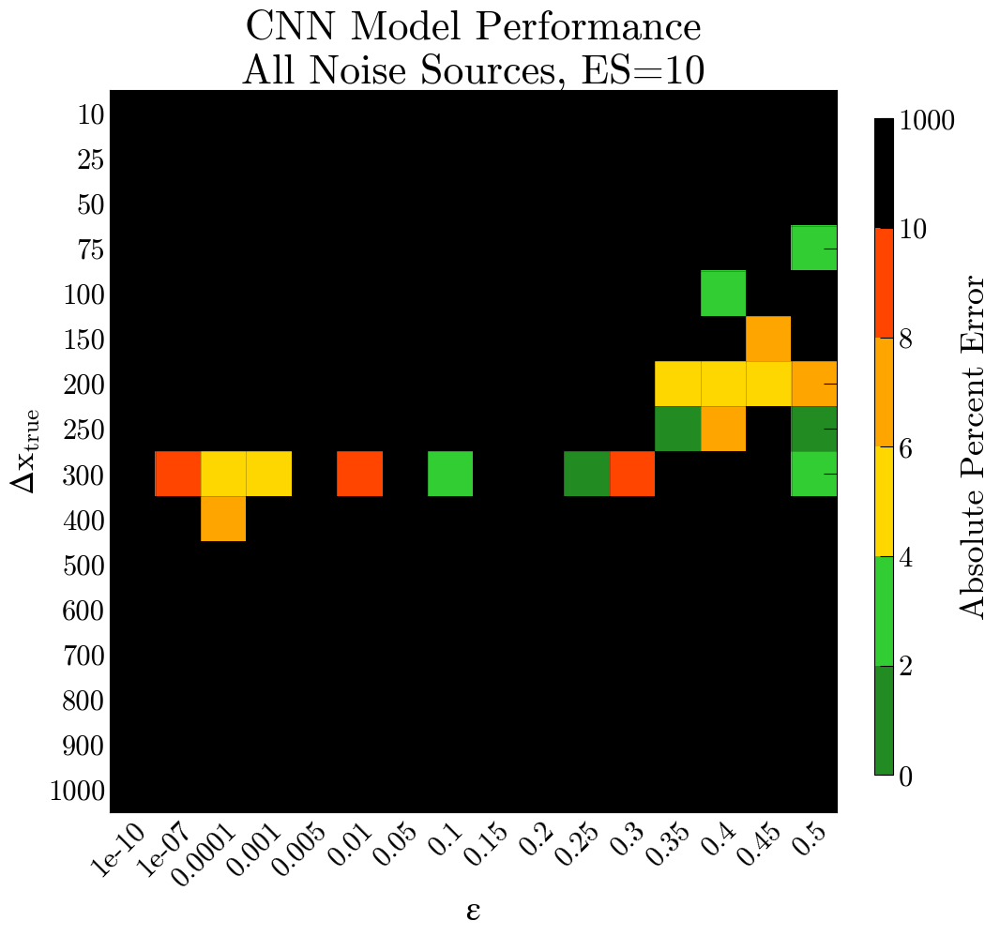

Number of squares with abs percent err>10%,  237


In [44]:
final_plot('10','CNN Model Performance\nAll Noise Sources, ES=10',statdy=60)